In [1]:
# Import the necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload
import os
import time

# Import the MFI library 
import MFI_lib1D as lib1
import MFI_class1D

# Set the path to the notebook and the data folder (and figures folder if needed)
if 'path_notebook' not in globals(): path_notebook = os.getcwd()
print("The path to the notebook is:", path_notebook)

if 'path_data' not in globals():
    if not os.path.isdir("_data_convergence_analysis/"): print("\nThe data folder \"_data_convergence_analysis/\" does not exist. Creating new folder."); os.mkdir(path_notebook + "/_data_convergence_analysis/"); 
    path_data = path_notebook + "/_data_convergence_analysis/"
print("The data folder is:", path_data)
# path_figures = "/home/ucecabj/Pictures/MFI_figures/"

# Set the plotting parameters
for _plt_parameters_ in [0]:
    from matplotlib import rc
    plt.rcParams.update({ "text.usetex": True, "font.family": "serif", "font.serif": ["Helvetica"], "font.size": 12, "axes.titleweight": "bold"})
    plw = 0.6  # width of (box line, tick line, ...)
    plt.rcParams.update({"axes.linewidth": plw, "figure.figsize": (4,3)}) 
    plt.rcParams.update({"xtick.top": True, "xtick.direction": "in", "xtick.major.width": plw, "xtick.minor.width": plw, "xtick.minor.visible": True, "xtick.major.size": 5})
    plt.rcParams.update({"ytick.right": True, "ytick.direction": "in", "ytick.major.width": plw, "ytick.minor.width": plw, "ytick.minor.visible": True, "ytick.major.size": 5})


# Load the grid, the FES, and the PLUMED grid. Change n_surf to select the surface.  
for _surf_parameters_ in [0]:
    [grid, y_list, y_string_list] = lib1.load_pkl(path_notebook + "/fes_list_1D")
    FES_cutoff_list = [30, 40, 50, 50, 50, 70, 60, 60, 70, 80, 80, 90, 80, 90, 80, 100, 100, 100, 110, 110]
    n_surf = 10
    y = y_list[n_surf]
    FES_cutoff = FES_cutoff_list[n_surf]
    y_string = y_string_list[n_surf]  
    plumed_dat_text = f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"
    dx, dy = grid[1] - grid[0], np.gradient(y, grid[1] - grid[0]) 
    [pl_x, pl_min, pl_max, pl_n, pl_ext] = lib1.get_plumed_grid_1D(grid, -7, 7, print_info=False)
    # print(f"Surface {n_surf}: {y_string}")
    # plt.figure(figsize=(5,4)); plt.plot(grid, y); plt.xlabel("x"); plt.ylabel("Free Energy [kJ/mol]"); plt.title(f"Free Energy Surface: S={n_surf}"); plt.show()

The path to the notebook is: /home/ucecabj/Desktop/MFI_git/MFI_class1D
The data folder is: /home/ucecabj/Desktop/MFI_git/MFI_class1D/_data_convergence_analysis/


#### Define default parameters

In [12]:
os.chdir(path_notebook); reload(MFI_class1D); reload(lib1); pass

In [2]:
default_params = {	"grid":grid, "y":y, "bw":dx*1.5, "periodic":False, #"dy":dy, # "initial_position":[0,0], 
					"System":"Langevin", "plumed_dat_text":plumed_dat_text, "pl_grid":pl_x, "simulation_steps": 1_000_000, 
					"position_pace":20, "metad_pace":200, "n_pos_per_window":10, 
     				"metad_width":0.1, "metad_height":3, "biasfactor":60 , 
         			"Bias_sf":1, "gaus_filter_sigma":None, 
                    "len_error_list":100, 
					"FES_cutoff":FES_cutoff, "calculate_FES_st_dev":False, "bootstrap_iter":50, "record_forces_e":True, "save_error_progression":True,
     				"simulation_folder_path": path_data, "print_info": False}

### Run Long simulation for reference

In [13]:
# Run 100 Long simulations
print_all = False

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # Run 100 long simulations
    long_sim_params = {**default_params}
    long_sim_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})
    fco = FES_cutoff_list[n_surf]
    long_sim_params.update({"FES_cutoff": fco, "metad_height": round(fco/30,2), "biasfactor": int(fco/3)})
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    long_sim_params.update({"simulation_folder_path": path_data})
    if not os.path.isdir(long_sim_params["simulation_folder_path"]): os.mkdir(long_sim_params["simulation_folder_path"])
    
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    for i_sim in range(1,101):
        
        sim_ID = f"_long_{i_sim}"
        long_sim_params.update({"ID":sim_ID})
                
        if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
            if print_all: print(f"Simulation {i_sim} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        else:
            if print_all: print(f"Simulation {i_sim}", end=" | ")
            MFI_long = MFI_class1D.MFI1D(**long_sim_params)
            if not os.path.isfile(path_data + f"position{sim_ID}"): MFI_long.run_simulation()
            MFI_long.analyse_data()
            t, aofe, aad, aBS = MFI_long.Avr_Error_list[:,0], MFI_long.Avr_Error_list[:,2], MFI_long.Avr_Error_list[:, MFI_long.aad_index], MFI_long.Avr_Error_list[:, MFI_long.abs_error_index]
                    
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, (AAD at 10% = {aad[10]:.4f}), ABS = {aBS[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: 
            aad_avr, abs_avr = np.mean(aad_collection, axis=0), np.mean(abs_collection, axis=0)
            print(f"--- Mean of final AAD: {aad_avr[-1]:.4f}, (10% = {aad_avr[10]:.4f}) || Mean of final ABS: {abs_avr[-1]:.4f}")
        
    if not print_all: 
        print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f}) || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")       



Surface 0 | Mean of final AAD: 0.2426, (10% = 3.4479) || Mean of final ABS: 0.2395
Surface 1 | Mean of final AAD: 0.3077, (10% = 2.2038) || Mean of final ABS: 0.2590
Surface 2 | Mean of final AAD: 0.5386, (10% = 5.0622) || Mean of final ABS: 0.3593
Surface 3 | Mean of final AAD: 0.3414, (10% = 4.6433) || Mean of final ABS: 0.3176
Surface 4 | Mean of final AAD: 0.6371, (10% = 4.4897) || Mean of final ABS: 0.4465
Surface 5 | Mean of final AAD: 0.4974, (10% = 5.4698) || Mean of final ABS: 0.4559
Surface 6 | Mean of final AAD: 0.4960, (10% = 8.8399) || Mean of final ABS: 0.5024
Surface 7 | Mean of final AAD: 0.4867, (10% = 2.8865) || Mean of final ABS: 0.4707
Surface 8 | Mean of final AAD: 0.4042, (10% = 5.3429) || Mean of final ABS: 0.4010
Surface 9 | Mean of final AAD: 0.5172, (10% = 4.7731) || Mean of final ABS: 0.5381
Surface 10 | Mean of final AAD: 0.7306, (10% = 6.6450) || Mean of final ABS: 0.5429
Surface 11 | Mean of final AAD: 0.7831, (10% = 10.0622) || Mean of final ABS: 0.5640
S

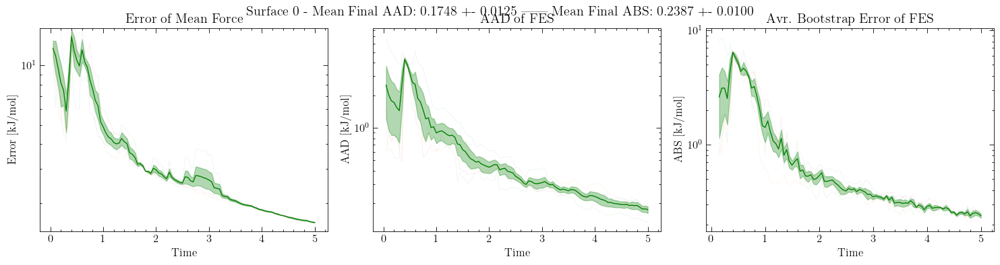

In [5]:
# Statistical Analysis of 100 long simulations
# for n_surf in range(20):
# for n_surf in [0,1,2,3,4,5,6]:
for n_surf in [0]:

    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"

    for i_sim in range(1,101):
    # for i_sim in range(1,5):
        sim_ID = f"_long_{i_sim}"
        t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        if i_sim == 1: t_collection, aofe_collection, aad_collection, abs_collection = [t], [aofe], [aad], [aBS]
        else: t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)

    t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
    t = t_collection[0]

    avr_results = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True)
    time_long, mean_ofe_long, ste_ofe_long, mean_aad_long, ste_aad_long, mean_abs_long, ste_abs_long = avr_results
    plt.subplot(1,3,1) 
    for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
    plt.subplot(1,3,2)
    for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
    plt.subplot(1,3,3)
    for i in range(len(abs_collection)): plt.plot(t, abs_collection[i], linewidth=0.5, alpha=0.1)

    plt.suptitle(f"Surface {n_surf} - Mean Final AAD: {mean_aad_long[-1]:.4f} +- {ste_aad_long[-1]:.4f} || Mean Final ABS: {mean_abs_long[-1]:.4f} +- {ste_abs_long[-1]:.4f}"); plt.show()


In [14]:
# Run 100 Long ALTERNATIVE EXTRA simulations (using a constant H=1 and BF=10)
print_all = False

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # Run 100 long simulations
    long_sim_params = {**default_params}
    long_sim_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})
    fco = FES_cutoff_list[n_surf]
    long_sim_params.update({"FES_cutoff": fco, "metad_height": 1, "biasfactor": 10, "simulation_steps": 3_000_000})
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    long_sim_params.update({"simulation_folder_path": path_data})
    if not os.path.isdir(long_sim_params["simulation_folder_path"]): os.mkdir(long_sim_params["simulation_folder_path"])
    
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    for i_sim in range(1,101):
        
        sim_ID = f"_longALTextra_{i_sim}"
        long_sim_params.update({"ID":sim_ID})
                
        if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
            if print_all: print(f"Simulation {i_sim} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        else:
            if print_all: print(f"Simulation {i_sim}", end=" | ")
            MFI_long = MFI_class1D.MFI1D(**long_sim_params)
            if not os.path.isfile(path_data + f"position{sim_ID}"): MFI_long.run_simulation()
            MFI_long.analyse_data()
            t, aofe, aad, aBS = MFI_long.Avr_Error_list[:,0], MFI_long.Avr_Error_list[:,2], MFI_long.Avr_Error_list[:, MFI_long.aad_index], MFI_long.Avr_Error_list[:, MFI_long.abs_error_index]
                    
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, (AAD at 10% = {aad[10]:.4f}), ABS = {aBS[-1]:.4f}")
        if i_sim % 5== 0 and print_all: 
            aad_avr, abs_avr = np.mean(aad_collection, axis=0), np.mean(abs_collection, axis=0)
            print(f"--- Mean of final AAD: {aad_avr[-1]:.4f}, (10% = {aad_avr[10]:.4f}) || Mean of final ABS: {abs_avr[-1]:.4f}")
        
    if not print_all: 
        print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f}) || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")       



Surface 0 | Mean of final AAD: 0.0969, (10% = 0.5244) || Mean of final ABS: 0.1237
Surface 1 | Mean of final AAD: 0.1567, (10% = 0.7368) || Mean of final ABS: 0.1418
Surface 2 | Mean of final AAD: 0.2319, (10% = 4.1486) || Mean of final ABS: 0.2438
Surface 3 | Mean of final AAD: 0.2584, (10% = 3.1035) || Mean of final ABS: 0.2224
Surface 4 | Mean of final AAD: 0.3685, (10% = 3.4086) || Mean of final ABS: 0.4397
Surface 5 | Mean of final AAD: 0.6514, (10% = 5.1950) || Mean of final ABS: 1.0684
Surface 6 | Mean of final AAD: 1.2416, (10% = 5.8547) || Mean of final ABS: 3.3263
Surface 7 | Mean of final AAD: 0.5888, (10% = 1.5492) || Mean of final ABS: 0.7783
Surface 8 | Mean of final AAD: 0.5699, (10% = 6.2081) || Mean of final ABS: 1.5889
Surface 9 | Mean of final AAD: 1.3860, (10% = 7.0791) || Mean of final ABS: 2.4978
Surface 10 | Mean of final AAD: 3.4264, (10% = 5.6032) || Mean of final ABS: 5.3812
Surface 11 | Mean of final AAD: 4.2080, (10% = 12.9362) || Mean of final ABS: 3.3683
S

In [9]:
# Run 100 Long EXPL simulations (with constant H=5 and BF=50)
print_all = False

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # Run 100 long simulations
    long_sim_params = {**default_params}
    long_sim_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})
    fco = FES_cutoff_list[n_surf]
    long_sim_params.update({"FES_cutoff": fco, "metad_height": 5, "biasfactor": 50})
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    long_sim_params.update({"simulation_folder_path": path_data})
    if not os.path.isdir(long_sim_params["simulation_folder_path"]): os.mkdir(long_sim_params["simulation_folder_path"])
    
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    for i_sim in range(1,81):
        
        sim_ID = f"_longEXPL_{i_sim}"
        long_sim_params.update({"ID":sim_ID})
                
        if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
            if print_all: print(f"Simulation {i_sim} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        else:
            if print_all: print(f"Simulation {i_sim}", end=" | ")
            MFI_long = MFI_class1D.MFI1D(**long_sim_params)
            if not os.path.isfile(path_data + f"position{sim_ID}"): MFI_long.run_simulation()
            MFI_long.analyse_data()
            t, aofe, aad, aBS = MFI_long.Avr_Error_list[:,0], MFI_long.Avr_Error_list[:,2], MFI_long.Avr_Error_list[:, MFI_long.aad_index], MFI_long.Avr_Error_list[:, MFI_long.abs_error_index]
                    
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, (AAD at 10% = {aad[10]:.4f}), ABS = {aBS[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: 
            aad_avr, abs_avr = np.mean(aad_collection, axis=0), np.mean(abs_collection, axis=0)
            print(f"--- Mean of final AAD: {aad_avr[-1]:.4f}, (10% = {aad_avr[10]:.4f}) || Mean of final ABS: {abs_avr[-1]:.4f}")
        
    if not print_all: 
        print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f}) || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")       



Surface 0 | Mean of final AAD: 0.3615, (10% = 1.9697) || Mean of final ABS: 0.3267
Surface 1 | Mean of final AAD: 0.3686, (10% = 1.8368) || Mean of final ABS: 0.3761
Surface 2 | Mean of final AAD: 0.5514, (10% = 2.1649) || Mean of final ABS: 0.4395
Surface 3 | Mean of final AAD: 0.4068, (10% = 2.3245) || Mean of final ABS: 0.4022
Surface 4 | Mean of final AAD: 0.6269, (10% = 2.5516) || Mean of final ABS: 0.4352
Surface 5 | Mean of final AAD: 0.4892, (10% = 3.1990) || Mean of final ABS: 0.4816
Surface 6 | Mean of final AAD: 0.4468, (10% = 2.8540) || Mean of final ABS: 0.4121
Surface 7 | Mean of final AAD: 0.5488, (10% = 2.4493) || Mean of final ABS: 0.4778
Surface 8 | Mean of final AAD: 0.4093, (10% = 2.5457) || Mean of final ABS: 0.4513
Surface 9 | Mean of final AAD: 0.5138, (10% = 3.1153) || Mean of final ABS: 0.5501
Surface 10 | Mean of final AAD: 0.7079, (10% = 3.7019) || Mean of final ABS: 0.5605
Surface 11 | Mean of final AAD: 0.8699, (10% = 4.6700) || Mean of final ABS: 0.6007
Su

### Exploration simulation

In [8]:
# Run 100 exploration simulations
print_all = False

for n_surf in [3]:
# for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]

    expl_sim_params = {**default_params}
    expl_sim_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})
    expl_sim_params.update({"simulation_steps":100_000, "len_error_list":25,"FES_cutoff": fco, "metad_height": round(fco/15,2), "biasfactor": int(10*fco/3)})
    expl_sim_params.update({"simulation_folder_path": path_data})
    expl_sim_params.update({"bootstrap_iter": None})
    if not os.path.isdir(expl_sim_params["simulation_folder_path"]): os.mkdir(expl_sim_params["simulation_folder_path"])
    
    t_collection, aofe_collection, aad_collection = [], [], []

    for i_sim in range(1,101):
                
        sim_ID = f"_expl_{i_sim}"
        expl_sim_params.update({"ID":sim_ID})
                
        if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
            if print_all: print(f"Simulation {i_sim} (exists)", end=" | ")            
            try: t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            except: 
                try: t, _, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
                except: t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            
        else:
            if print_all: print(f"Simulation {i_sim}", end=" | ")
            MFI_expl = MFI_class1D.MFI1D(**expl_sim_params)
            if not os.path.isfile(path_data + f"position{sim_ID}"): MFI_expl.run_simulation()
            MFI_expl.analyse_data()
            t, aofe, aad = MFI_expl.Avr_Error_list[:,0], MFI_expl.Avr_Error_list[:,2], MFI_expl.Avr_Error_list[:, MFI_expl.aad_index]

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: 
            print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")       
    if not print_all: print(f"  AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")       


Surface 3  AAD: 2.4173


Mean Final AAD: 2.4173 +- 0.0919


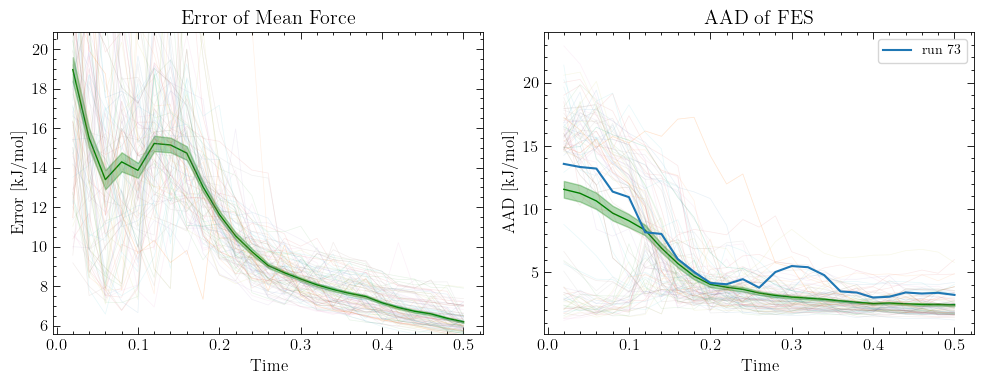

In [10]:
# Statistical Analysis of 100 exploration simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_expl, mean_ofe_expl, ste_ofe_expl, mean_aad_expl, ste_aad_expl = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)

print(f"Mean Final AAD: {mean_aad_expl[-1]:.4f} +- {ste_aad_expl[-1]:.4f}")

plt.plot(t, aad_collection[37-1], label="run 73")
plt.legend(fontsize=10)
plt.show()


Simulation 1 | Simulation 2 | Simulation 3 | Simulation 4 | Simulation 5 | 


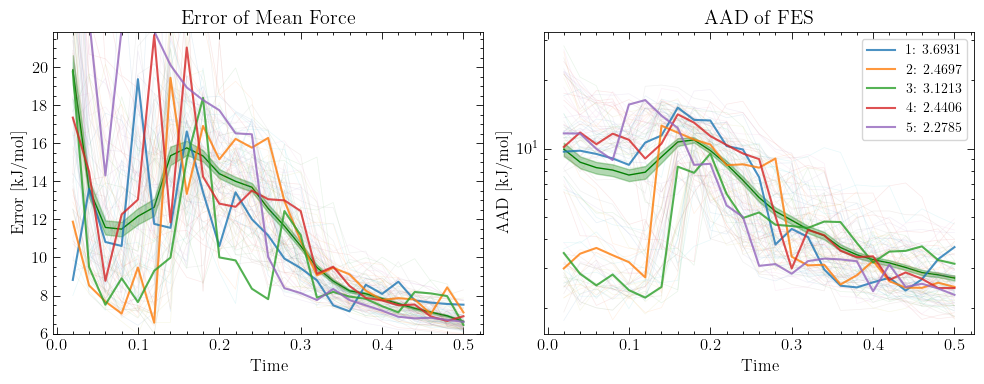

Simulation 6 | Simulation 7 | Simulation 8 | Simulation 9 | Simulation 10 | 


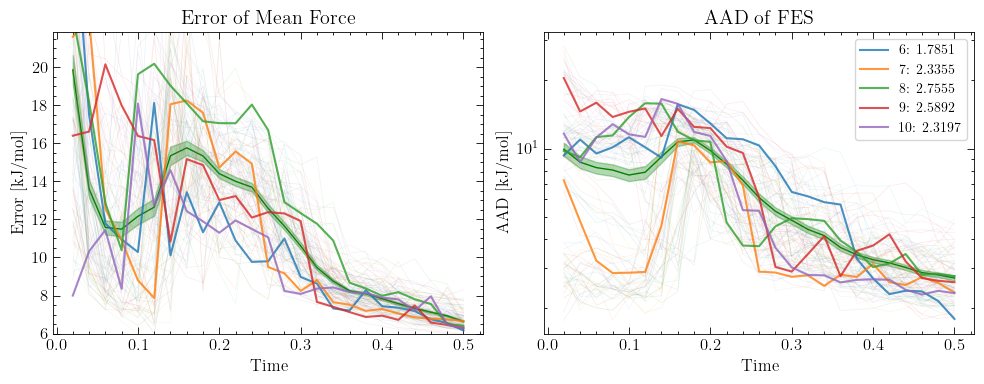

Simulation 11 | Simulation 12 | Simulation 13 | Simulation 14 | Simulation 15 | 


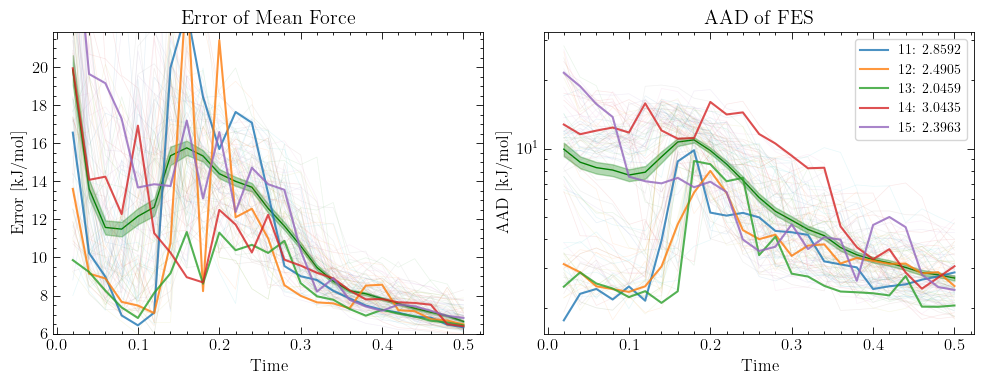

Simulation 16 | Simulation 17 | Simulation 18 | Simulation 19 | Simulation 20 | 


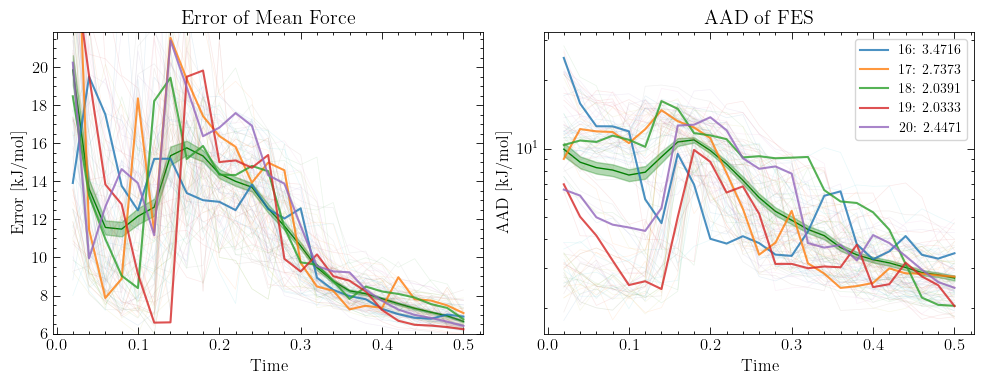

Simulation 21 | Simulation 22 | Simulation 23 | Simulation 24 | Simulation 25 | 


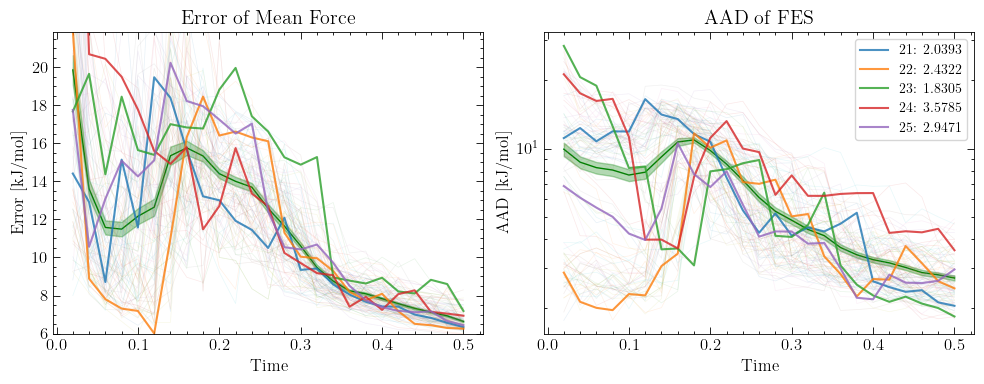

Simulation 26 | Simulation 27 | Simulation 28 | Simulation 29 | Simulation 30 | 


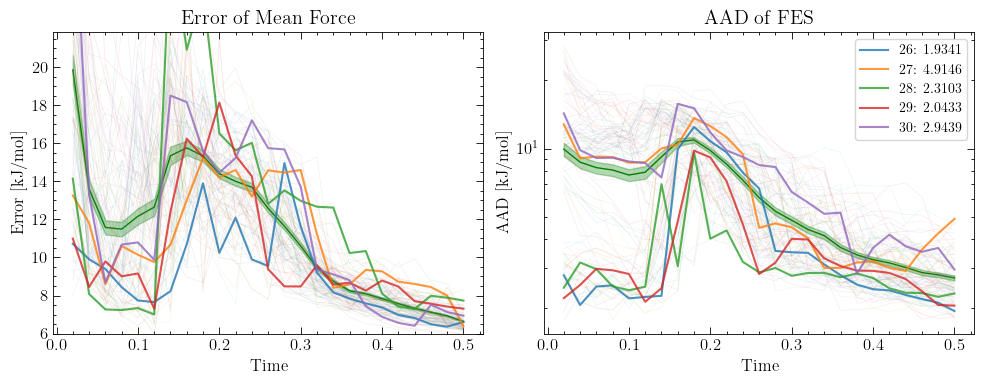

Simulation 31 | Simulation 32 | Simulation 33 | Simulation 34 | Simulation 35 | 


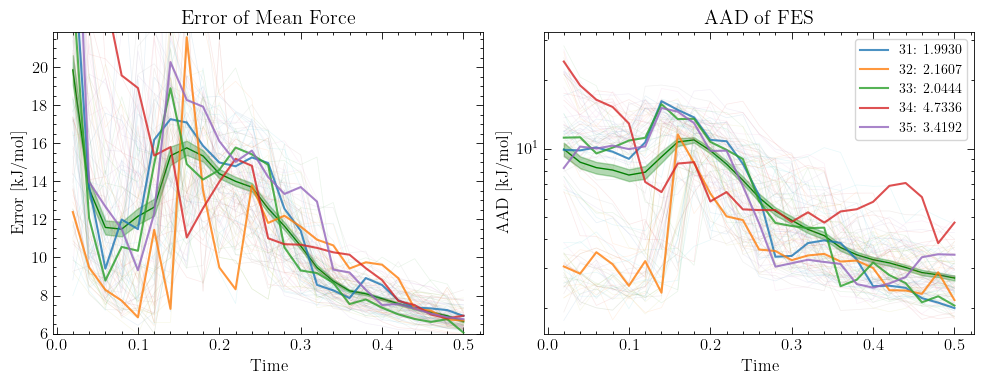

Simulation 36 | Simulation 37 | Simulation 38 | Simulation 39 | Simulation 40 | 


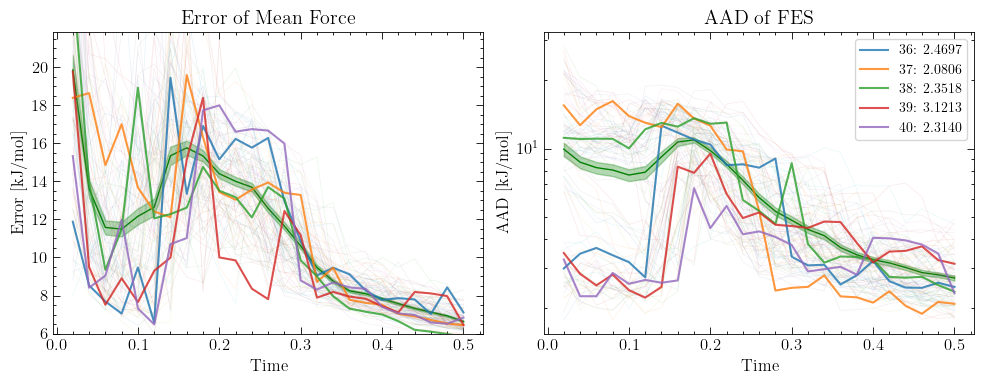

Simulation 41 | Simulation 42 | Simulation 43 | Simulation 44 | Simulation 45 | 


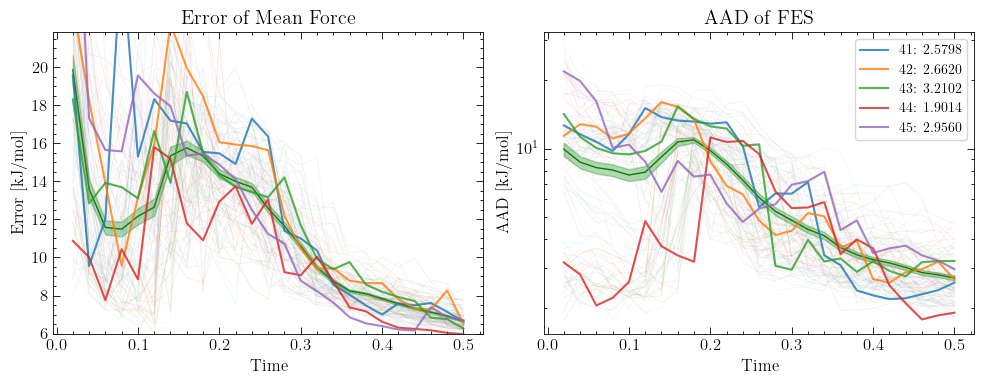

Simulation 46 | Simulation 47 | Simulation 48 | Simulation 49 | Simulation 50 | 


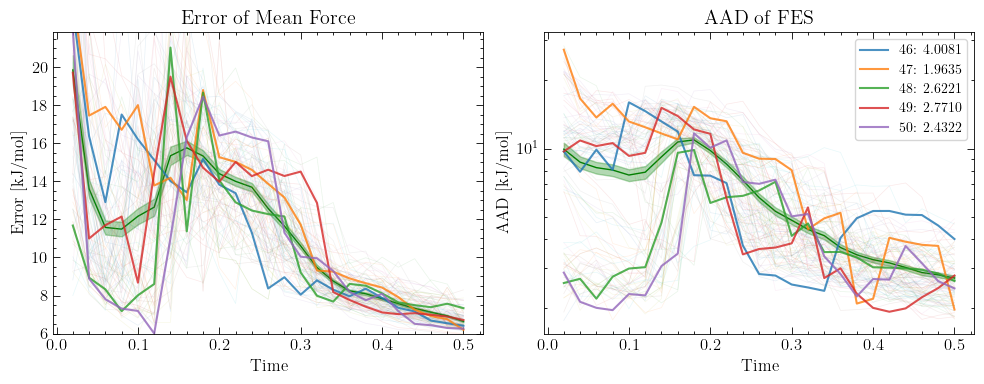

Simulation 51 | Simulation 52 | Simulation 53 | Simulation 54 | Simulation 55 | 


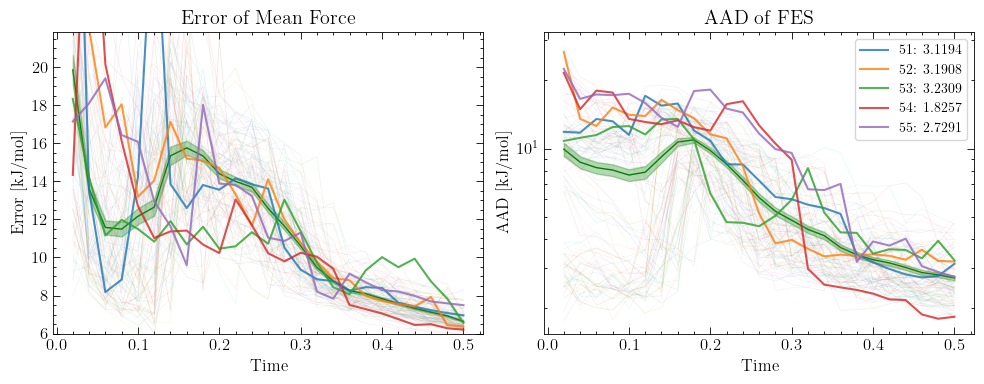

Simulation 56 | Simulation 57 | Simulation 58 | Simulation 59 | Simulation 60 | 


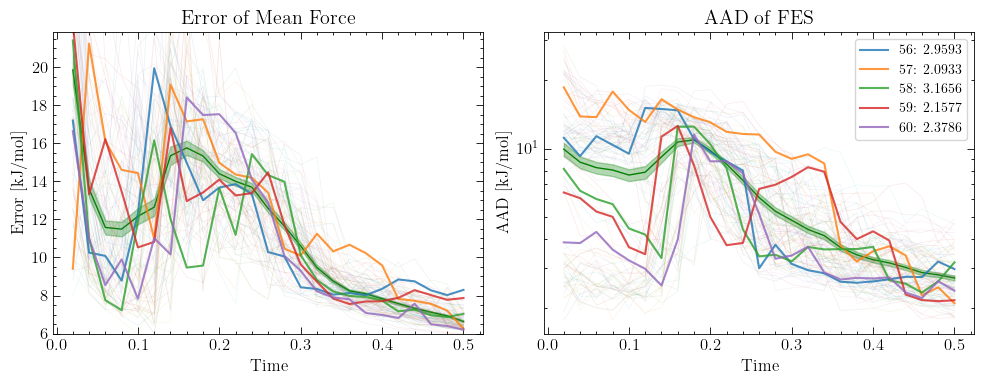

Simulation 61 | Simulation 62 | Simulation 63 | Simulation 64 | Simulation 65 | 


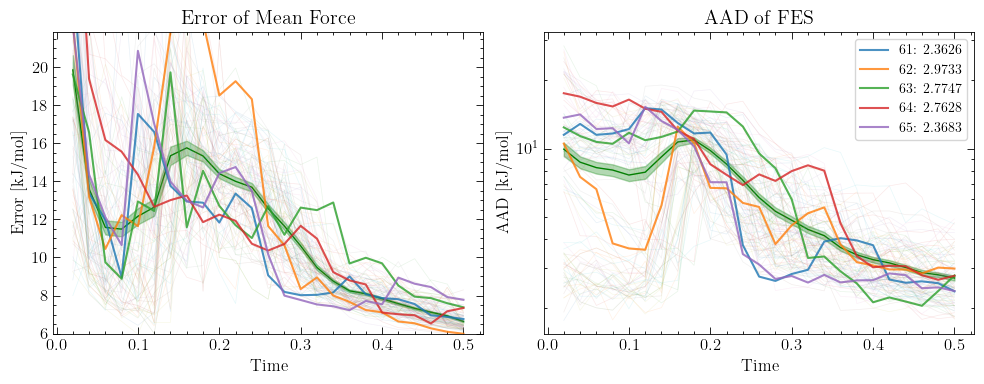

Simulation 66 | Simulation 67 | Simulation 68 | Simulation 69 | Simulation 70 | 


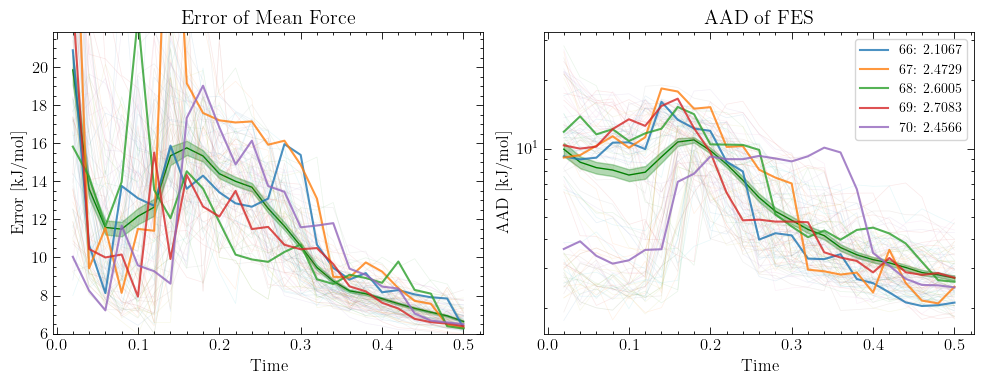

Simulation 71 | Simulation 72 | Simulation 73 | Simulation 74 | Simulation 75 | 


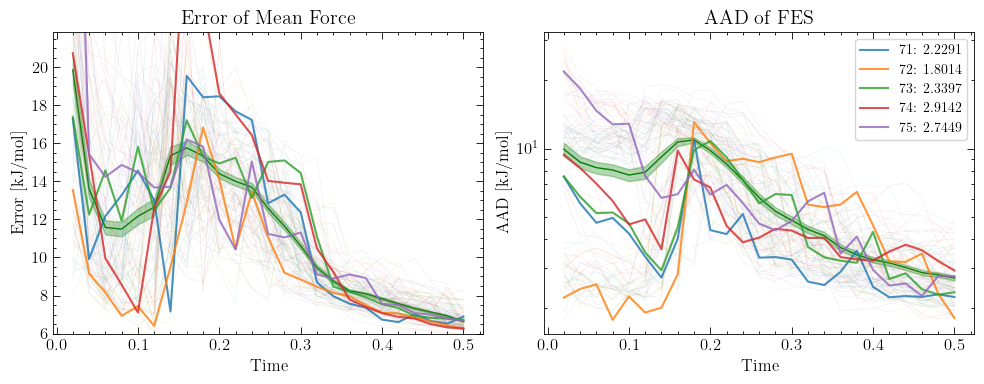

Simulation 76 | Simulation 77 | Simulation 78 | Simulation 79 | Simulation 80 | 


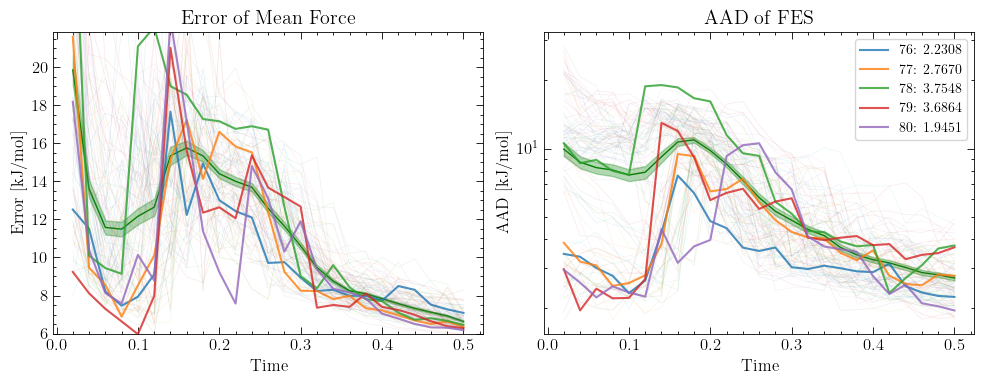

Simulation 81 | Simulation 82 | Simulation 83 | Simulation 84 | Simulation 85 | 


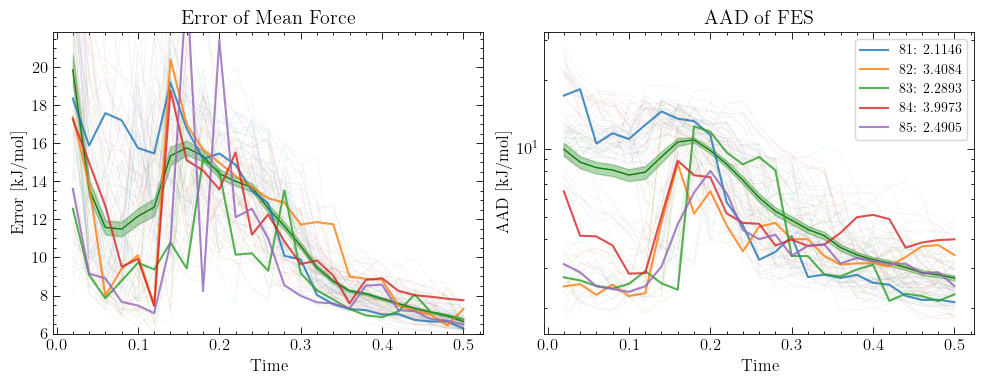

Simulation 86 | Simulation 87 | Simulation 88 | Simulation 89 | Simulation 90 | 


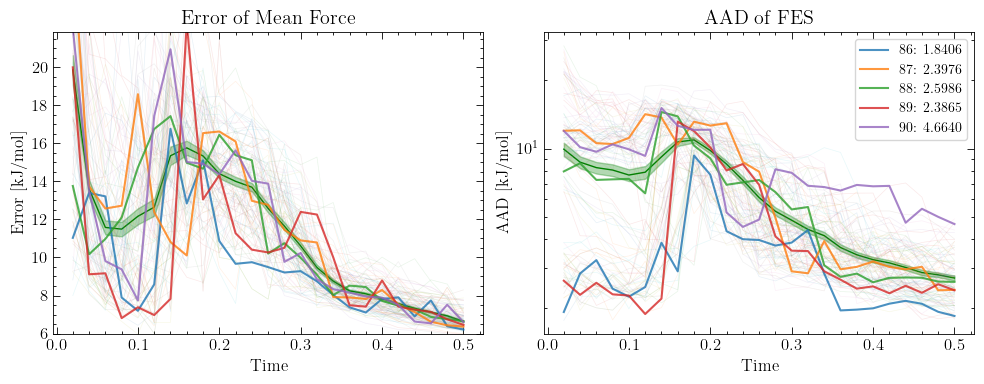

Simulation 91 | Simulation 92 | Simulation 93 | Simulation 94 | Simulation 95 | 


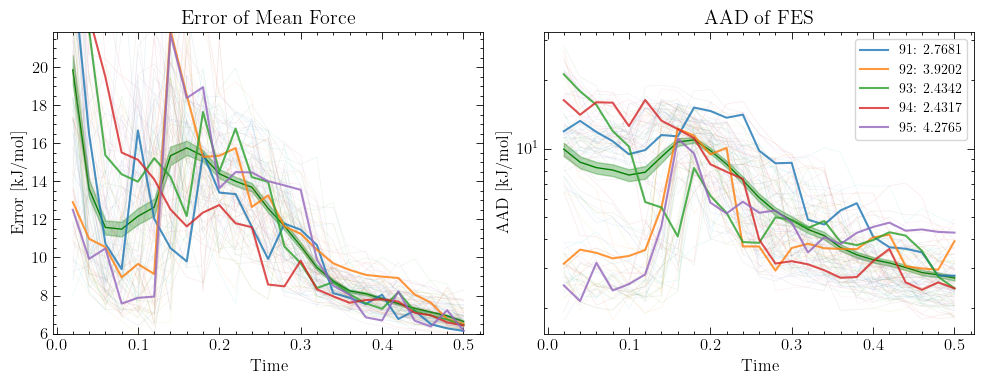

Simulation 96 | Simulation 97 | Simulation 98 | Simulation 99 | Simulation 100 | 


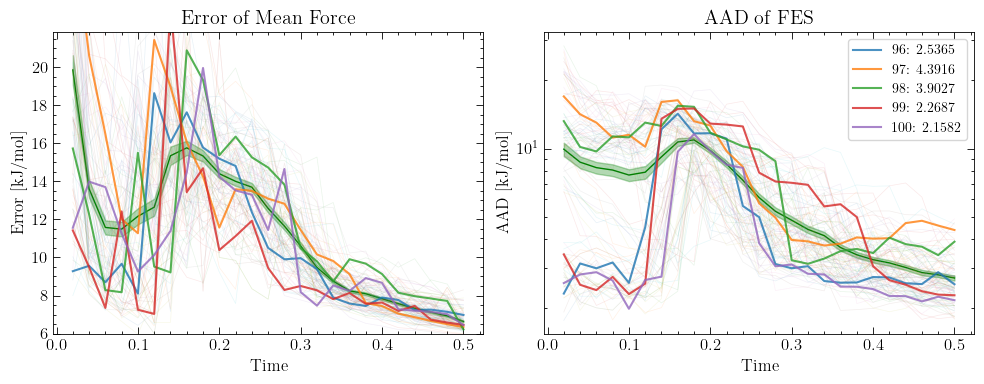

In [4]:
# Plot all exploration simulations to find a representative one to use for metad stage

for n_surf in [6]:

    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"

    for i_sim in range(1,101):
        sim_ID = f"_expl_{i_sim}"
        try: t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        except:
            try: t, _, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            except: t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        if i_sim == 1: t_collection, aofe_collection, aad_collection = [t], [aofe], [aad]
        else: t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)

    t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
    t = t_collection[0]

    for j in range(1, 21):
        
        # make plot of mean error progression
        time_expl, mean_ofe_expl, ste_ofe_expl, mean_aad_expl, ste_aad_expl = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        
        #plot all error progressions with alpha=0.1
        plt.subplot(1,2,1) 
        for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
        plt.subplot(1,2,2)
        for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)    
        
        
        for jj in range((j-1)*5, (j)*5):
            
            print(f"Simulation {jj+1}", end=" | ")
            
            plt.subplot(1,2,1)
            plt.plot(t, aofe_collection[jj], label=f"{jj+1}", alpha=0.8)
            plt.subplot(1,2,2)
            plt.plot(t, aad_collection[jj], label=f"{jj+1}: {aad_collection[jj][-1]:.4f}", alpha=0.8)
            # print(f"aad = {aad_collection[jj][-1]:.4f}", end=" | ")
        
        print("")    
        plt.legend(fontsize=10)
        plt.yscale("log")
        plt.show() 
                                                                                                        

Surface 4
Final Error: Aofe = 6.3428, AAD = 2.3696
MIN(FES+Bias) = 42.5536, MIN(Z+Bias) = 42.5865


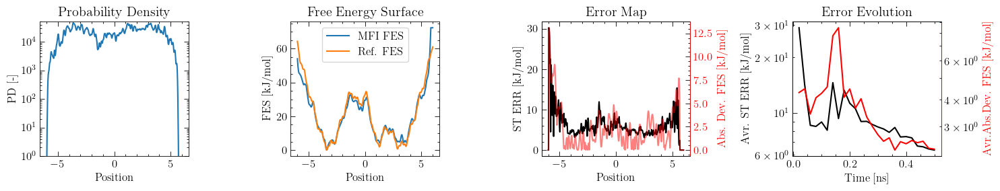

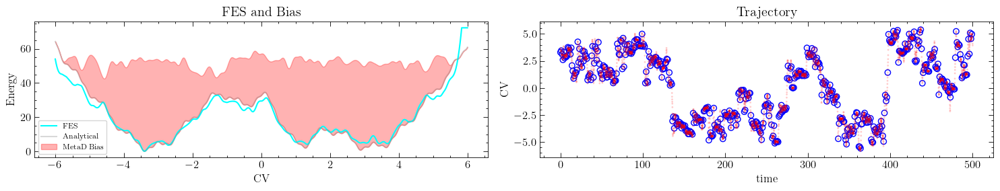

In [7]:
# Show "example" Exploration Simulation used for MetaD stage
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

n_surf = 4
print(f"Surface {n_surf}")
i_sim = expl_sim_index_list[n_surf]
path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
new_params = {**default_params}
new_params.update({"save_error_progression":False, "save_force_terms":False})
new_params.update({"ID":f"_expl_{i_sim}", "len_error_list":25, "simulation_folder_path": path_data, "y": y_list[n_surf], "FES_cutoff": FES_cutoff_list[n_surf]})
MFI_expl = MFI_class1D.MFI1D(**new_params); # MFI_expl.run_simulation()   ########################
MFI_expl.analyse_data()

print(f"Final Error: Aofe = {MFI_expl.Aofe:.4f}, AAD = {MFI_expl.AAD:.4f}\nMIN(FES+Bias) = {np.min(MFI_expl.FES + MFI_expl.Bias):.4f}, MIN(Z+Bias) = {np.min(MFI_expl.y + MFI_expl.Bias):.4f}")
MFI_expl.plot_results();    
lib1.plot_FES_Bias_and_Traj(grid=MFI_expl.grid, fes=MFI_expl.FES, metad_bias=MFI_expl.Bias, position=MFI_expl.position, hills=MFI_expl.hills, y=MFI_expl.y );       
t_expl, v_expl, aofe_expl, aad_expl = MFI_expl.Avr_Error_list[:,0], MFI_expl.Avr_Error_list[:,1], MFI_expl.Avr_Error_list[:,2], MFI_expl.Avr_Error_list[:, MFI_expl.aad_index];     
force_terms_expl, sim_time_expl, fes_expl = MFI_expl.force_terms, MFI_expl.sim_time, MFI_expl.FES
forces_e_list_expl = MFI_expl.forces_e_list


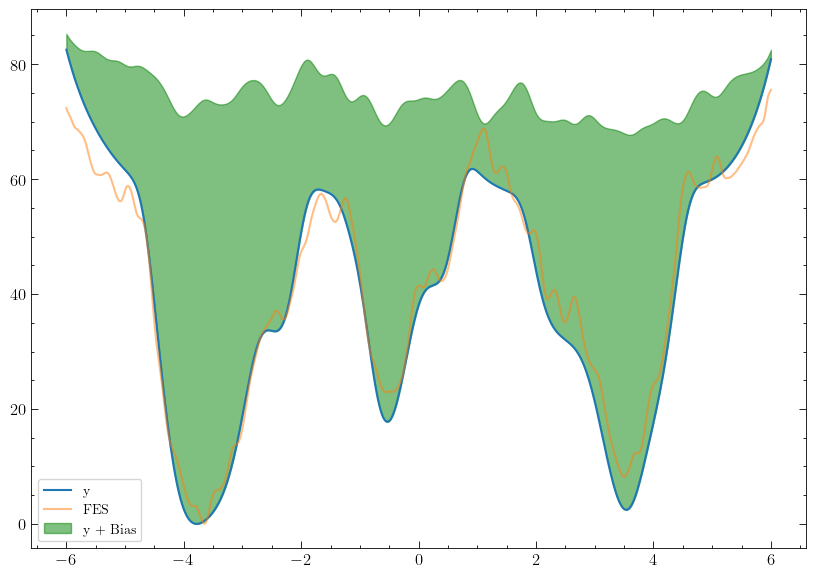

In [42]:
# plot the static bias for the next simulation.
plt.figure(figsize=(10,7))
plt.plot(grid, MFI_expl.y, label="y")
plt.plot(grid, MFI_expl.FES, label="FES", alpha=0.5)

new_Bias, new_Fbias, path_bias = lib1.make_external_bias_1D(grid_mfi=grid, FES=MFI_expl.FES, Bias=None, Bias_sf=1, gaus_filter_sigma=5, FES_cutoff=MFI_expl.FES_cutoff, 
                      pl_min=pl_min, pl_max=pl_max, periodic=False, file_name_extension="", return_array=True, cv_name="p.x")

# new_Bias = - new_Bias - np.min(-new_Bias)
# plt.plot(grid, new_Bias, label="Bias")

plt.fill_between(grid, MFI_expl.y , MFI_expl.y + new_Bias, color="green", alpha=0.5, label="y + Bias")
# plt.fill_between(grid, MFI_expl.y , MFI_expl.y + MFI_expl.Bias, color="green", alpha=0.5, label="y + Bias")

plt.legend(fontsize=10)
plt.show()

### 2nd Stage - Run MetaD simulation

In [27]:
# # test metad simulation

# metad_sim_params = {**default_params}
# metad_sim_params.update({"simulation_steps":900_000, "len_error_list":100, "save_error_progression":True, "save_results":True})#, "n_pos":47_500})
# metad_sim_params.update({"biasfactor":10})#, "Bias_sf":1.03, "gaus_filter_sigma":2})
# metad_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})

# i_sim = 9
# # sim_ID = f"_metad_{i_sim}"
# sim_ID = f"_metad_test"
# metad_sim_params.update({"ID":sim_ID})

# MFI_metad = MFI_class1D.MFI1D(**metad_sim_params)
# MFI_metad.make_external_bias(FES=fes_expl)
# MFI_metad.run_simulation()
# MFI_metad.analyse_data()

# MFI_metad.plot_results()
# lib1.plot_FES_Bias_and_Traj(grid=MFI_metad.grid, fes=MFI_metad.FES, metad_bias=MFI_metad.Bias, static_bias=MFI_metad.Bias_static, position=MFI_metad.position, hills=MFI_metad.hills, y=MFI_metad.y )

# plt.figure(figsize=(10,10))

# plt.plot(grid, MFI_metad.FES, label="FES");


In [16]:
# Run 100 MetaD simulations
print_all = False
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")
    
    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    sim_ID_expl = f"_expl_{expl_sim_index_list[n_surf]}"
    if os.path.isfile(path_data + f"MFI_results{sim_ID_expl}.pkl"):
        res = lib1.load_pkl(path_data + f"MFI_results{sim_ID_expl}.pkl")[1]
        force_terms_expl = res[0]
        fes_expl = lib1.intg_1D(force_terms_expl[2], dx)
        sim_time_expl = res[1].T[0][-1]
        forces_e_list_expl = res[-1]
    else:
        # Set the base (exploration) simulation and get the fes, force terms, and simulation time
        expl_params = {**default_params}
        expl_params.update({"ID":sim_ID_expl, "len_error_list":25, "save_results":True, "save_error_progression":False, "save_force_terms":False})
        MFI_expl = MFI_class1D.MFI1D(**expl_params)
        MFI_expl.analyse_data()
        fes_expl, force_terms_expl, sim_time_expl, forces_e_list_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time, MFI_expl.forces_e_list
    
    # Set the parameters for the metad simulations
    metad_sim_params = {**default_params}
    metad_sim_params.update({"simulation_steps":900_000, "len_error_list":100, "save_error_progression":True, "save_results":True})
    metad_sim_params.update({"metad_height": round(fco/30,2), "biasfactor": 1+round(fco/15, 2), "gaus_filter_sigma":5})
    metad_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl, "base_forces_e_list":forces_e_list_expl})

    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    for i_sim in range(1,101):
        
        sim_ID = f"_metad_{i_sim}"
        metad_sim_params.update({"ID":sim_ID})
        
        # if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
        if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
            if print_all: print(f"Simulation {i_sim} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            
        else:
            if print_all: print(f"Simulation {i_sim}", end=" | ")
            MFI_metad = MFI_class1D.MFI1D(**metad_sim_params)
            MFI_metad.make_external_bias(FES=fes_expl)
            if not os.path.isfile(path_data + f"position{sim_ID}"): MFI_metad.run_simulation()
            MFI_metad.analyse_data()
            t, aofe, aad, aBS = MFI_metad.Avr_Error_list[:,0], MFI_metad.Avr_Error_list[:,2], MFI_metad.Avr_Error_list[:, MFI_metad.aad_index], MFI_metad.Avr_Error_list[:, MFI_metad.abs_error_index]

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)     
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, ABS = {aBS[-1]:.4f}")
        if print_all and i_sim % 5 == 0: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f} || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")


Surface 0 | Mean of final AAD: 0.2715 || Mean of final ABS: 0.1859
Surface 1 | Mean of final AAD: 0.3235 || Mean of final ABS: 0.2789
Surface 2 | Mean of final AAD: 0.7197 || Mean of final ABS: 0.3767
Surface 3 | Mean of final AAD: 0.5828 || Mean of final ABS: 0.4543
Surface 4 | Mean of final AAD: 0.5462 || Mean of final ABS: 0.5571
Surface 5 | Mean of final AAD: 0.4858 || Mean of final ABS: 0.4053
Surface 6 | Mean of final AAD: 0.4350 || Mean of final ABS: 0.4900
Surface 7 | Mean of final AAD: 0.8675 || Mean of final ABS: 0.4753
Surface 8 | Mean of final AAD: 0.3564 || Mean of final ABS: 0.4164
Surface 9 | Mean of final AAD: 0.5681 || Mean of final ABS: 0.6099
Surface 10 | Mean of final AAD: 0.8063 || Mean of final ABS: 0.9852
Surface 11 | Mean of final AAD: 0.9192 || Mean of final ABS: 0.8476
Surface 12 | Mean of final AAD: 0.4931 || Mean of final ABS: 0.5026
Surface 13 | Mean of final AAD: 0.6286 || Mean of final ABS: 0.7477
Surface 14 | Mean of final AAD: 0.4982 || Mean of final AB

Mean Final AAD: 0.5935 +- 0.0145 || Mean Final ABS: 0.6616 +- 0.0077


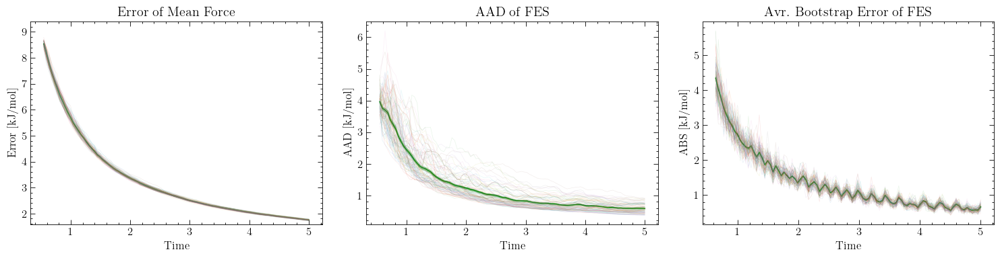

In [49]:
# Statistical Analysis of 100 MetaD simulations
t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
t = t_collection[0]

time_metad, mean_ofe_metad, ste_ofe_metad, mean_aad_metad, ste_aad_metad, mean_abs_metad, ste_abs_metad = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,3,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,3,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,3,3)
for i in range(len(abs_collection)): plt.plot(t, abs_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metad[-1]:.4f} +- {ste_aad_metad[-1]:.4f} || Mean Final ABS: {mean_abs_metad[-1]:.4f} +- {ste_abs_metad[-1]:.4f}")
plt.show()

In [17]:
# Run 100 MetaD ALTERNATIVE simulations
print_all = False
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")
    
    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    sim_ID_expl = f"_expl_{expl_sim_index_list[n_surf]}"
    if os.path.isfile(path_data + f"MFI_results{sim_ID_expl}.pkl"):
        res = lib1.load_pkl(path_data + f"MFI_results{sim_ID_expl}.pkl")[1]
        force_terms_expl = res[0]
        fes_expl = lib1.intg_1D(force_terms_expl[2], dx)
        sim_time_expl = res[1].T[0][-1]
        forces_e_list_expl = res[-1]
    else:
        # Set the base (exploration) simulation and get the fes, force terms, and simulation time
        expl_params = {**default_params}
        expl_params.update({"ID":sim_ID_expl, "len_error_list":25, "save_results":True, "save_error_progression":False, "save_force_terms":False})
        MFI_expl = MFI_class1D.MFI1D(**expl_params)
        MFI_expl.analyse_data()
        fes_expl, force_terms_expl, sim_time_expl, forces_e_list_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time, MFI_expl.forces_e_list
    
    # Set the parameters for the metad simulations
    metad_sim_params = {**default_params}
    metad_sim_params.update({"simulation_steps":900_000, "len_error_list":100, "save_error_progression":True, "save_results":True})
    metad_sim_params.update({"metad_height": round(fco/30,2), "biasfactor": 1+round(fco/15, 2), "gaus_filter_sigma":5})
    # metad_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    metad_sim_params.update({"base_forces":None, "base_time":sim_time_expl, "base_forces_e_list":None})

    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    for i_sim in range(1, 101):
        
        sim_ID = f"_metad_{i_sim}"
        sim_ID_ALT = f"_metadALT_{i_sim}"
        metad_sim_params.update({"ID":sim_ID})
        
        # if os.path.isfile(path_data + f"error_progression{sim_ID}.pkl"):
        if os.path.isfile(path_data + f"error_progression{sim_ID_ALT}.pkl"):
            if print_all: print(f"Simulation {i_sim} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID_ALT}.pkl")
            
        else:
            if print_all: print(f"Simulation {i_sim}", end=" | ")
            MFI_metad = MFI_class1D.MFI1D(**metad_sim_params)
            MFI_metad.make_external_bias(FES=fes_expl)
            if not os.path.isfile(path_data + f"position{sim_ID}"): MFI_metad.run_simulation()
            MFI_metad.ID = sim_ID_ALT
            MFI_metad.analyse_data()
            t, aofe, aad, aBS = MFI_metad.Avr_Error_list[:,0], MFI_metad.Avr_Error_list[:,2], MFI_metad.Avr_Error_list[:, MFI_metad.aad_index], MFI_metad.Avr_Error_list[:, MFI_metad.abs_error_index]
        
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, ABS = {aBS[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f} || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")       


Surface 0 | Mean of final AAD: 0.2614 || Mean of final ABS: 0.1568
Surface 1 | Mean of final AAD: 0.2294 || Mean of final ABS: 0.1771
Surface 2 | Mean of final AAD: 0.2983 || Mean of final ABS: 0.2057
Surface 3 | Mean of final AAD: 0.2772 || Mean of final ABS: 0.2848
Surface 4 | Mean of final AAD: 0.4594 || Mean of final ABS: 0.3560
Surface 5 | Mean of final AAD: 0.2907 || Mean of final ABS: 0.2145
Surface 6 | Mean of final AAD: 0.3522 || Mean of final ABS: 0.2353
Surface 7 | Mean of final AAD: 0.4278 || Mean of final ABS: 0.2699
Surface 8 | Mean of final AAD: 0.2935 || Mean of final ABS: 0.2255
Surface 9 | Mean of final AAD: 0.3921 || Mean of final ABS: 0.3680
Surface 10 | Mean of final AAD: 0.4122 || Mean of final ABS: 0.3060
Surface 11 | Mean of final AAD: 0.4688 || Mean of final ABS: 0.2726
Surface 12 | Mean of final AAD: 0.3405 || Mean of final ABS: 0.2471
Surface 13 | Mean of final AAD: 0.4240 || Mean of final ABS: 0.3485
Surface 14 | Mean of final AAD: 0.3769 || Mean of final AB

### 2nd Stage - Run 2x MetaD simulations

In [ ]:
# Patching of 50x2 MetaD simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl, forces_e_list_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time, MFI_expl.forces_e_list
    
    # Set the parameters for the metad simulations
    metadx2_sim_params = {**default_params}
    metadx2_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx2_sim_params.update({"gaus_filter_sigma":5})
    metadx2_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl, "base_forces_e_list":forces_e_list_expl})
    # metadx2_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    n_parallel = 2
    parallel_efficiency = 0.75

    for n_camp in range(1, 51):
        
        camp_ID = f"_metadx2_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        # ifos.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
        if 1==2 and os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx2 = MFI_class1D.MFI1D(**metadx2_sim_params)
            MFI_metadx2.make_external_bias(FES=fes_expl)
            mfi_parallel_x2 = MFI_metadx2.MFI_parallel(parent=MFI_metadx2, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x2.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x2.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x2.patch_simulations()
            t, v, aofe, aad, aBS = MFI_metadx2.Avr_Error_list[:,0], MFI_metadx2.Avr_Error_list[:,1], MFI_metadx2.Avr_Error_list[:,2], MFI_metadx2.Avr_Error_list[:, MFI_metadx2.aad_index], MFI_metadx2.Avr_Error_list[:, MFI_metadx2.abs_error_index]
            lib1.save_pkl(np.array([t, v, aofe, aad, aBS]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)       
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, ABS = {aBS[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f} || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")       




Surface 0
Analysis 1 | Final Error: Aofe = 1.1118, AAD = 0.2760, ABS = 0.1778
Analysis 2 | Final Error: Aofe = 1.1006, AAD = 0.3288, ABS = 0.1587
Analysis 3 | Final Error: Aofe = 1.1035, AAD = 0.3055, ABS = 0.1892
Analysis 4 | Final Error: Aofe = 1.1046, AAD = 0.2379, ABS = 0.1532


Mean Final AAD: 0.2871 +- 0.0170


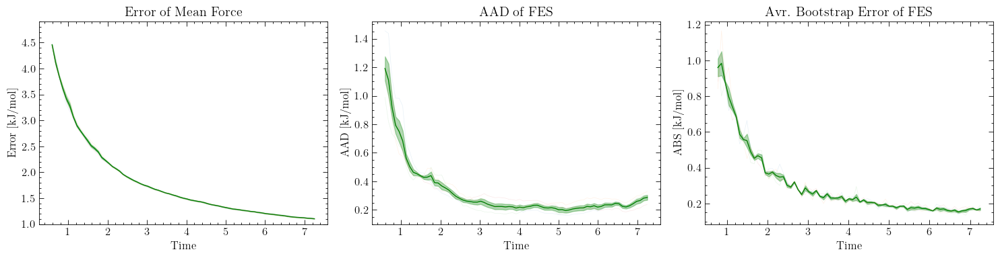

In [60]:
# Statistical Analysis of 50x2 MetaD simulations
t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
t = t_collection[0]

avr_results = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection,
                                                                                                        return_results=True, plot=False, plot_log=False)
time_metadx2, mean_ofe_metadx2, ste_ofe_metadx2, mean_aad_metadx2, ste_aad_metadx2, mean_abs_metadx2, ste_abs_metadx2 = avr_results
plt.subplot(1,3,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,3,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,3,3)
for i in range(len(abs_collection)): plt.plot(t, abs_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx2[-1]:.4f} +- {ste_aad_metadx2[-1]:.4f}")
plt.show()

In [ ]:
# Patching of 50x2 MetaD ALTERNATIVE simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx2_sim_params = {**default_params}
    metadx2_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx2_sim_params.update({"gaus_filter_sigma":5})
    # metadx2_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    metadx2_sim_params.update({"base_forces":None, "base_time":sim_time_expl, "base_forces_e_list":None})

    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []

    n_parallel = 2
    parallel_efficiency = 0.75

    # for n_camp in range(1, 51):
    for n_camp in range(1, 51):
        
        camp_ID = f"_metadx2ALT_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
        # if 1==2 and os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx2 = MFI_class1D.MFI1D(**metadx2_sim_params)
            MFI_metadx2.make_external_bias(FES=fes_expl)
            mfi_parallel_x2 = MFI_metadx2.MFI_parallel(parent=MFI_metadx2, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x2.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x2.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x2.patch_simulations()
            t, v, aofe, aad, aBS = MFI_metadx2.Avr_Error_list[:,0], MFI_metadx2.Avr_Error_list[:,1], MFI_metadx2.Avr_Error_list[:,2], MFI_metadx2.Avr_Error_list[:, MFI_metadx2.aad_index], MFI_metadx2.Avr_Error_list[:, MFI_metadx2.abs_error_index]
            lib1.save_pkl(np.array([t, v, aofe, aad, aBS]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)       
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}, ABS = {aBS[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f} || Mean of final ABS: {np.mean(abs_collection, axis=0)[-1]:.4f}")       




Surface 0
Analysis 1 | Final Error: Aofe = 1.1309, AAD = 0.2980, ABS = 0.1338
Analysis 2 | Final Error: Aofe = 1.1158, AAD = 0.3095, ABS = 0.1660
Analysis 3 | Final Error: Aofe = 1.1196, AAD = 0.3583, ABS = 0.1510
Analysis 4 | Final Error: Aofe = 1.1239, AAD = 0.1937, ABS = 0.1661


Mean Final AAD: 0.8705 +- 0.0427


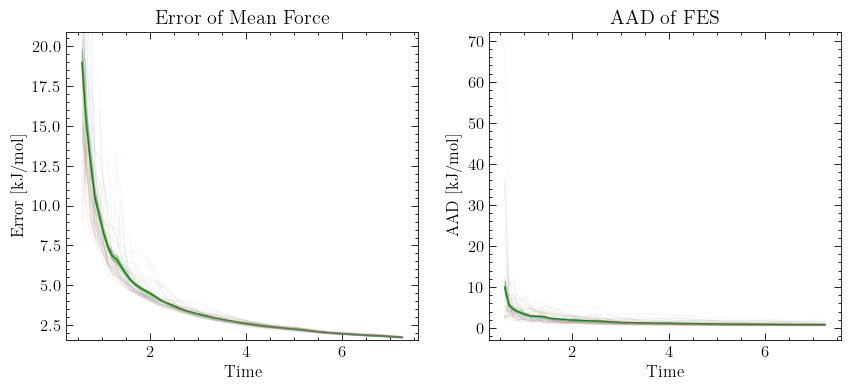

In [16]:
# Statistical Analysis of 50x2 MetaD simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_metadx2, mean_ofe_metadx2, ste_ofe_metadx2, mean_aad_metadx2, ste_aad_metadx2 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx2[-1]:.4f} +- {ste_aad_metadx2[-1]:.4f}")
plt.show()

### 2nd Stage - Run 3x MetaD simulations

In [102]:
os.chdir(path_notebook); reload(MFI_class1D); reload(lib1);

In [7]:
# Patching of 33x3 MetaD simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx3_sim_params = {**default_params}
    metadx3_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx3_sim_params.update({"gaus_filter_sigma":5})
    metadx3_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    # metadx3_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []


    n_parallel = 3
    parallel_efficiency = 0.667

    for n_camp in range(1, 34):
        
        camp_ID = f"_metadx3_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx3 = MFI_class1D.MFI1D(**metadx3_sim_params)
            MFI_metadx3.make_external_bias(FES=fes_expl)
            mfi_parallel_x3 = MFI_metadx3.MFI_parallel(parent=MFI_metadx3, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x3.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x3.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x3.patch_simulations()
            t, aofe, aad = MFI_metadx3.Avr_Error_list[:,0], MFI_metadx3.Avr_Error_list[:,2], MFI_metadx3.Avr_Error_list[:, MFI_metadx3.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       
 




Surface 0
Analysis 1 | Final Error: Aofe = 0.9688, AAD = 0.2744
Analysis 2 | Final Error: Aofe = 0.9548, AAD = 0.2272
Analysis 3 | Final Error: Aofe = 0.9634, AAD = 0.2025
Analysis 4 | Final Error: Aofe = 0.9612, AAD = 0.2132
Analysis 5 | Final Error: Aofe = 0.9599, AAD = 0.1488
--- Mean of final AAD: 0.2132
Analysis 6 | Final Error: Aofe = 0.9579, AAD = 0.1510
Analysis 7 | Final Error: Aofe = 0.9648, AAD = 0.2142
Analysis 8 | Final Error: Aofe = 0.9588, AAD = 0.1730
Analysis 9 | Final Error: Aofe = 0.9650, AAD = 0.1844
Analysis 10 | Final Error: Aofe = 0.9583, AAD = 0.1199
--- Mean of final AAD: 0.1908
Analysis 11 | Final Error: Aofe = 0.9542, AAD = 0.1727
Analysis 12 | Final Error: Aofe = 0.9594, AAD = 0.1951
Analysis 13 | Final Error: Aofe = 0.9586, AAD = 0.2713
Analysis 14 | Final Error: Aofe = 0.9550, AAD = 0.1240
Analysis 15 | Final Error: Aofe = 0.9691, AAD = 0.2135
--- Mean of final AAD: 0.1923
Analysis 16 | Final Error: Aofe = 0.9517, AAD = 0.1438
Analysis 17 | Final Error: 

Mean Final AAD: 1.0466 +- 0.0504


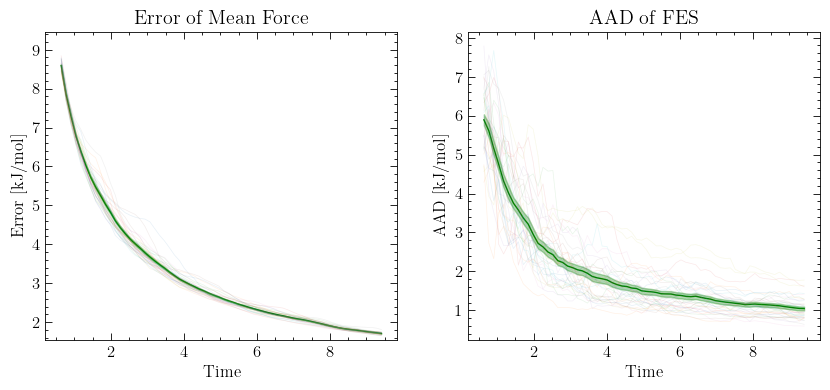

In [8]:
# Statistical Analysis of 33x3 MetaD simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_metadx3, mean_ofe_metadx3, ste_ofe_metadx3, mean_aad_metadx3, ste_aad_metadx3 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx3[-1]:.4f} +- {ste_aad_metadx3[-1]:.4f}")
plt.show()

In [17]:
# Patching of 33x3 MetaD ALTERNATIVE simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx3_sim_params = {**default_params}
    metadx3_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx3_sim_params.update({"gaus_filter_sigma":5})
    # metadx3_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    metadx3_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []


    n_parallel = 3
    parallel_efficiency = 0.667

    for n_camp in range(1, 34):
        
        camp_ID = f"_metadx3ALT_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx3 = MFI_class1D.MFI1D(**metadx3_sim_params)
            MFI_metadx3.make_external_bias(FES=fes_expl)
            mfi_parallel_x3 = MFI_metadx3.MFI_parallel(parent=MFI_metadx3, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x3.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x3.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x3.patch_simulations()
            t, aofe, aad = MFI_metadx3.Avr_Error_list[:,0], MFI_metadx3.Avr_Error_list[:,2], MFI_metadx3.Avr_Error_list[:, MFI_metadx3.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       
 




Surface 0
Analysis 1 | Final Error: Aofe = 0.9807, AAD = 0.2818
Analysis 2 | Final Error: Aofe = 0.9643, AAD = 0.2321
Analysis 3 | Final Error: Aofe = 0.9754, AAD = 0.1786
Analysis 4 | Final Error: Aofe = 0.9704, AAD = 0.2172
Analysis 5 | Final Error: Aofe = 0.9718, AAD = 0.1222
--- Mean of final AAD: 0.2064
Analysis 6 | Final Error: Aofe = 0.9662, AAD = 0.1245
Analysis 7 | Final Error: Aofe = 0.9741, AAD = 0.1882
Analysis 8 | Final Error: Aofe = 0.9675, AAD = 0.1853
Analysis 9 | Final Error: Aofe = 0.9776, AAD = 0.1637
Analysis 10 | Final Error: Aofe = 0.9706, AAD = 0.1054
--- Mean of final AAD: 0.1799
Analysis 11 | Final Error: Aofe = 0.9658, AAD = 0.1610
Analysis 12 | Final Error: Aofe = 0.9716, AAD = 0.1984
Analysis 13 | Final Error: Aofe = 0.9702, AAD = 0.2410
Analysis 14 | Final Error: Aofe = 0.9668, AAD = 0.1392
Analysis 15 | Final Error: Aofe = 0.9816, AAD = 0.2000
--- Mean of final AAD: 0.1826
Analysis 16 | Final Error: Aofe = 0.9598, AAD = 0.1382
Analysis 17 | Final Error: 

### 2nd Stage - Run 4x MetaD simulations

In [33]:
# Patching of 25x4 MetaD simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(1):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx4_sim_params = {**default_params}
    metadx4_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx4_sim_params.update({"gaus_filter_sigma":5})
    metadx4_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    # metadx2_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []

    n_parallel = 4
    parallel_efficiency = 0.5

    for n_camp in range(1, 2):
        
        camp_ID = f"_metadx4_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx4 = MFI_class1D.MFI1D(**metadx4_sim_params)
            MFI_metadx4.make_external_bias(FES=fes_expl)
            mfi_parallel_x4 = MFI_metadx4.MFI_parallel(parent=MFI_metadx4, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x4.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x4.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x4.patch_simulations()
            t, aofe, aad = MFI_metadx4.Avr_Error_list[:,0], MFI_metadx4.Avr_Error_list[:,2], MFI_metadx4.Avr_Error_list[:, MFI_metadx4.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       





Surface 0
Analysis 1 (exists) | Final Error: Aofe = 0.9538, AAD = 0.1499


Mean Final AAD: 1.0888 +- 0.0615


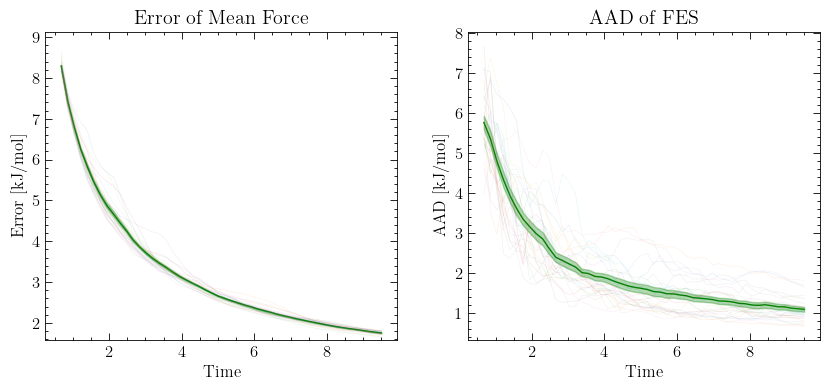

In [10]:
# Statistical Analysis of 25x4 MetaD simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_metadx4, mean_ofe_metadx4, ste_ofe_metadx4, mean_aad_metadx4, ste_aad_metadx4 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx4[-1]:.4f} +- {ste_aad_metadx4[-1]:.4f}")
plt.show()

In [38]:
# Patching of 25x4 MetaD ALTERNATIVE simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx4_sim_params = {**default_params}
    metadx4_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx4_sim_params.update({"gaus_filter_sigma":5})
    # metadx4_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    metadx4_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []

    n_parallel = 4
    parallel_efficiency = 0.5

    for n_camp in range(1, 26):
        
        camp_ID = f"_metadx4ALT_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx4 = MFI_class1D.MFI1D(**metadx4_sim_params)
            MFI_metadx4.make_external_bias(FES=fes_expl)
            mfi_parallel_x4 = MFI_metadx4.MFI_parallel(parent=MFI_metadx4, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x4.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x4.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x4.patch_simulations()
            t, aofe, aad = MFI_metadx4.Avr_Error_list[:,0], MFI_metadx4.Avr_Error_list[:,2], MFI_metadx4.Avr_Error_list[:, MFI_metadx4.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       





Surface 0
Analysis 1 | Final Error: Aofe = 0.9624, AAD = 0.1322
Analysis 2 | Final Error: Aofe = 0.9545, AAD = 0.1174
Analysis 3 | Final Error: Aofe = 0.9618, AAD = 0.1980
Analysis 4 | Final Error: Aofe = 0.9687, AAD = 0.1284
Analysis 5 | Final Error: Aofe = 0.9559, AAD = 0.1569
--- Mean of final AAD: 0.1466
Analysis 6 | Final Error: Aofe = 0.9625, AAD = 0.1348
Analysis 7 | Final Error: Aofe = 0.9677, AAD = 0.0909
Analysis 8 | Final Error: Aofe = 0.9607, AAD = 0.0899
Analysis 9 | Final Error: Aofe = 0.9681, AAD = 0.1725
Analysis 10 | Final Error: Aofe = 0.9628, AAD = 0.1508
--- Mean of final AAD: 0.1372
Analysis 11 | Final Error: Aofe = 0.9572, AAD = 0.1159
Analysis 12 | Final Error: Aofe = 0.9615, AAD = 0.1011
Analysis 13 | Final Error: Aofe = 0.9669, AAD = 0.0849
Analysis 14 | Final Error: Aofe = 0.9620, AAD = 0.1084
Analysis 15 | Final Error: Aofe = 0.9659, AAD = 0.1089
--- Mean of final AAD: 0.1261
Analysis 16 | Final Error: Aofe = 0.9576, AAD = 0.1439
Analysis 17 | Final Error: 

Mean Final AAD: 1.0466 +- 0.0504


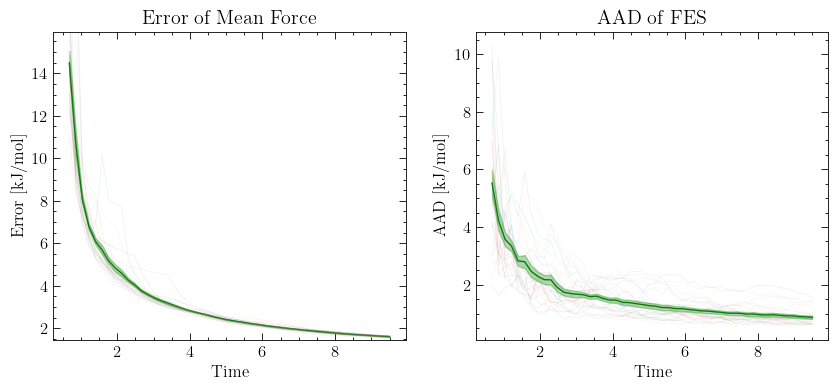

0.6800000000000002


In [39]:
# Statistical Analysis of 25x4 MetaD simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_metadx4, mean_ofe_metadx4, ste_ofe_metadx4, mean_aad_metadx4, ste_aad_metadx4 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx3[-1]:.4f} +- {ste_aad_metadx3[-1]:.4f}")
plt.show()


### 2nd Stage 6x MetaD simulation

In [11]:
# Patching of 16x6 MetaD simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx6_sim_params = {**default_params}
    metadx6_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx6_sim_params.update({"gaus_filter_sigma":5})
    metadx6_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    # metadx6_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []

    n_parallel = 6
    parallel_efficiency = 0.4

    for n_camp in range(1, 17):
        
        camp_ID = f"_metadx6_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx6 = MFI_class1D.MFI1D(**metadx6_sim_params)
            MFI_metadx6.make_external_bias(FES=fes_expl)
            mfi_parallel_x6 = MFI_metadx6.MFI_parallel(parent=MFI_metadx6, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x6.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x6.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x6.patch_simulations()
            t, aofe, aad = MFI_metadx6.Avr_Error_list[:,0], MFI_metadx6.Avr_Error_list[:,2], MFI_metadx6.Avr_Error_list[:, MFI_metadx6.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       




Surface 0
Analysis 1 | Final Error: Aofe = 0.8725, AAD = 0.1436
Analysis 2 | Final Error: Aofe = 0.8727, AAD = 0.1863
Analysis 3 | Final Error: Aofe = 0.8734, AAD = 0.1638
Analysis 4 | Final Error: Aofe = 0.8675, AAD = 0.1466
Analysis 5 | Final Error: Aofe = 0.8755, AAD = 0.1316
--- Mean of final AAD: 0.1544
Analysis 6 | Final Error: Aofe = 0.8708, AAD = 0.1598
Analysis 7 | Final Error: Aofe = 0.8710, AAD = 0.1324
Analysis 8 | Final Error: Aofe = 0.8684, AAD = 0.1375
Analysis 9 | Final Error: Aofe = 0.8771, AAD = 0.1385
Analysis 10 | Final Error: Aofe = 0.8717, AAD = 0.1100
--- Mean of final AAD: 0.1450
Analysis 11 | Final Error: Aofe = 0.8691, AAD = 0.1944
Analysis 12 | Final Error: Aofe = 0.8723, AAD = 0.1944
Analysis 13 | Final Error: Aofe = 0.8685, AAD = 0.1487
Analysis 14 | Final Error: Aofe = 0.8736, AAD = 0.1576
Analysis 15 | Final Error: Aofe = 0.8724, AAD = 0.1506
--- Mean of final AAD: 0.1530
Analysis 16 | Final Error: Aofe = 0.8744, AAD = 0.1168


Surface 1
Analysis 1 | Fi

Mean Final AAD: 1.0466 +- 0.0504


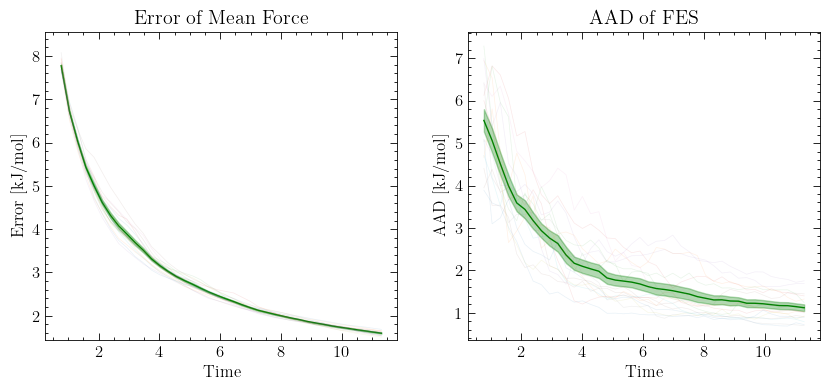

In [12]:
# Statistical Analysis of 16x6 MetaD simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_metadx6, mean_ofe_metadx6, ste_ofe_metadx6, mean_aad_metadx6, ste_aad_metadx6 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx3[-1]:.4f} +- {ste_aad_metadx3[-1]:.4f}")
plt.show()

In [19]:
# Patching of 16x6 MetaD ALTERNATIVE simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx6_sim_params = {**default_params}
    metadx6_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx6_sim_params.update({"gaus_filter_sigma":5})
    # metadx6_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    metadx6_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []

    n_parallel = 6
    parallel_efficiency = 0.4

    for n_camp in range(1, 17):
        
        camp_ID = f"_metadx6ALT_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx6 = MFI_class1D.MFI1D(**metadx6_sim_params)
            MFI_metadx6.make_external_bias(FES=fes_expl)
            mfi_parallel_x6 = MFI_metadx6.MFI_parallel(parent=MFI_metadx6, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x6.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x6.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x6.patch_simulations()
            t, aofe, aad = MFI_metadx6.Avr_Error_list[:,0], MFI_metadx6.Avr_Error_list[:,2], MFI_metadx6.Avr_Error_list[:, MFI_metadx6.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       




Surface 0
Analysis 1 | Final Error: Aofe = 0.8781, AAD = 0.1330
Analysis 2 | Final Error: Aofe = 0.8784, AAD = 0.1628
Analysis 3 | Final Error: Aofe = 0.8821, AAD = 0.1567
Analysis 4 | Final Error: Aofe = 0.8765, AAD = 0.1189
Analysis 5 | Final Error: Aofe = 0.8849, AAD = 0.1002
--- Mean of final AAD: 0.1343
Analysis 6 | Final Error: Aofe = 0.8796, AAD = 0.1433
Analysis 7 | Final Error: Aofe = 0.8767, AAD = 0.1146
Analysis 8 | Final Error: Aofe = 0.8772, AAD = 0.1146
Analysis 9 | Final Error: Aofe = 0.8864, AAD = 0.1214
Analysis 10 | Final Error: Aofe = 0.8807, AAD = 0.0881
--- Mean of final AAD: 0.1254
Analysis 11 | Final Error: Aofe = 0.8778, AAD = 0.1924
Analysis 12 | Final Error: Aofe = 0.8779, AAD = 0.1809
Analysis 13 | Final Error: Aofe = 0.8773, AAD = 0.1280
Analysis 14 | Final Error: Aofe = 0.8826, AAD = 0.1301
Analysis 15 | Final Error: Aofe = 0.8813, AAD = 0.1321
--- Mean of final AAD: 0.1345
Analysis 16 | Final Error: Aofe = 0.8835, AAD = 0.0872


Surface 1
Analysis 1 | Fi

### 2nd Stage 10x MetaD simulation

In [13]:
# Patching of 10x10 MetaD simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx10_sim_params = {**default_params}
    metadx10_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx10_sim_params.update({"gaus_filter_sigma":5})
    metadx10_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    # metadx10_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []

    n_parallel = 10
    parallel_efficiency = 0.3

    for n_camp in range(1, 11):
        
        camp_ID = f"_metadx10_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx10 = MFI_class1D.MFI1D(**metadx10_sim_params)
            MFI_metadx10.make_external_bias(FES=fes_expl)
            mfi_parallel_x10 = MFI_metadx10.MFI_parallel(parent=MFI_metadx10, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x10.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x10.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x10.patch_simulations()
            t, aofe, aad = MFI_metadx10.Avr_Error_list[:,0], MFI_metadx10.Avr_Error_list[:,2], MFI_metadx10.Avr_Error_list[:, MFI_metadx10.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       




Surface 0


Analysis 1 | Final Error: Aofe = 0.7761, AAD = 0.1425
--- Mean of final AAD: 0.1425
Analysis 2 | Final Error: Aofe = 0.7771, AAD = 0.1613
--- Mean of final AAD: 0.1519
Analysis 3 | Final Error: Aofe = 0.7744, AAD = 0.1494
--- Mean of final AAD: 0.1511
Analysis 4 | Final Error: Aofe = 0.7782, AAD = 0.1761
--- Mean of final AAD: 0.1573
Analysis 5 | Final Error: Aofe = 0.7730, AAD = 0.1452
--- Mean of final AAD: 0.1549
Analysis 6 | Final Error: Aofe = 0.7758, AAD = 0.1207
--- Mean of final AAD: 0.1492
Analysis 7 | Final Error: Aofe = 0.7748, AAD = 0.1969
--- Mean of final AAD: 0.1560
Analysis 8 | Final Error: Aofe = 0.7697, AAD = 0.1414
--- Mean of final AAD: 0.1542
Analysis 9 | Final Error: Aofe = 0.7752, AAD = 0.1584
--- Mean of final AAD: 0.1547
Analysis 10 | Final Error: Aofe = 0.7749, AAD = 0.1123
--- Mean of final AAD: 0.1504


Surface 1
Analysis 1 | Final Error: Aofe = 0.8427, AAD = 0.2089
--- Mean of final AAD: 0.2089
Analysis 2 | Final Error: Aofe = 0.8426, AAD = 0.2209
--- Mean 

Mean Final AAD: 1.0466 +- 0.0504


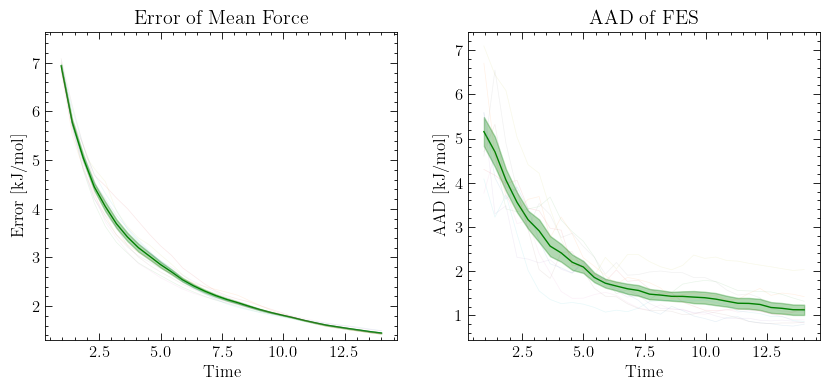

In [14]:
# Statistical Analysis of 10x10 MetaD simulations
t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
t = t_collection[0]

time_metadx10, mean_ofe_metadx10, ste_ofe_metadx10, mean_aad_metadx10, ste_aad_metadx10 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, 
                                                                                                        return_results=True, plot=False, plot_log=False)
plt.subplot(1,2,1) 
for i in range(len(aofe_collection)): plt.plot(t, aofe_collection[i], linewidth=0.5, alpha=0.1)
plt.subplot(1,2,2)
for i in range(len(aad_collection)): plt.plot(t, aad_collection[i], linewidth=0.5, alpha=0.1)
print(f"Mean Final AAD: {mean_aad_metadx3[-1]:.4f} +- {ste_aad_metadx3[-1]:.4f}")
plt.show()

In [20]:
# Patching of 10x10 MetaD ALTERNATIVE simulations
print_all = True
expl_sim_index_list = [13, 91, 7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

for n_surf in range(20):
    
    print(f"\n\nSurface {n_surf}") if print_all else print(f"Surface {n_surf}", end="")

    # set common parameters
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    fco = FES_cutoff_list[n_surf]
    default_params.update({"simulation_folder_path": path_data, "FES_cutoff": FES_cutoff_list[n_surf]})
    default_params.update({"y": y_list[n_surf], "plumed_dat_text": f"p: DISTANCE ATOMS=1,2 COMPONENTS\nff: MATHEVAL ARG=p.x FUNC=({y_string_list[n_surf]}) PERIODIC=NO\nbb: BIASVALUE ARG=ff\n"})

    # Set the base (exploration) simulation and get the fes, force terms, and simulation time
    expl_params = {**default_params}
    expl_params.update({"ID":f"_expl_{expl_sim_index_list[n_surf]}", "len_error_list":25, "save_error_progression":False, "save_force_terms":False})
    MFI_expl = MFI_class1D.MFI1D(**expl_params)
    MFI_expl.analyse_data()
    fes_expl, force_terms_expl, sim_time_expl = MFI_expl.FES, MFI_expl.force_terms, MFI_expl.sim_time
    
    # Set the parameters for the metad simulations
    metadx10_sim_params = {**default_params}
    metadx10_sim_params.update({"save_error_progression":False, "save_results":False})
    metadx10_sim_params.update({"gaus_filter_sigma":5})
    # metadx10_sim_params.update({"base_forces":force_terms_expl, "base_time":sim_time_expl})
    metadx10_sim_params.update({"base_forces":None, "base_time":sim_time_expl})

    t_collection, aofe_collection, aad_collection = [], [], []

    n_parallel = 10
    parallel_efficiency = 0.3

    for n_camp in range(1, 11):
        
        camp_ID = f"_metadx10ALT_{n_camp}"
        new_params.update({"ID":camp_ID})
        
        if os.path.isfile(path_data + f"error_progression{camp_ID}.pkl"):
            if print_all: print(f"Analysis {n_camp} (exists)", end=" | ")
            t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{camp_ID}.pkl")
            
        else:   
            if print_all: print(f"Analysis {n_camp}", end=" | ")
            MFI_metadx10 = MFI_class1D.MFI1D(**metadx10_sim_params)
            MFI_metadx10.make_external_bias(FES=fes_expl)
            mfi_parallel_x10 = MFI_metadx10.MFI_parallel(parent=MFI_metadx10, workers=n_parallel)

            camp_sim = 0
            for i_sim in range((n_camp-1)*n_parallel+1, (n_camp)*n_parallel+1):
                res = lib1.load_pkl(path_data + f"MFI_results_metad_{i_sim}.pkl")
                mfi_parallel_x10.sim[camp_sim].Avr_Error_list = res[1][1][:int(len(res[1][1])*parallel_efficiency)]
                mfi_parallel_x10.sim[camp_sim].forces_e_list = res[1][2][:int(len(res[1][2])*parallel_efficiency)]
                camp_sim += 1 

            mfi_parallel_x10.patch_simulations()
            t, aofe, aad = MFI_metadx10.Avr_Error_list[:,0], MFI_metadx10.Avr_Error_list[:,2], MFI_metadx10.Avr_Error_list[:, MFI_metadx10.aad_index]
            lib1.save_pkl(np.array([t, aofe, aad]), path_data + f"error_progression{camp_ID}.pkl")

        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)        
        if print_all: print(f"Final Error: Aofe = {aofe[-1]:.4f}, AAD = {aad[-1]:.4f}")
        if i_sim % 5 == 0 and print_all: print(f"--- Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}")
        
    if not print_all: print(f" | Mean of final AAD: {np.mean(aad_collection, axis=0)[-1]:.4f}, (10% = {np.mean(aad_collection, axis=0)[10]:.4f})")       




Surface 0
Analysis 1 | Final Error: Aofe = 0.7822, AAD = 0.1208
--- Mean of final AAD: 0.1208
Analysis 2 | Final Error: Aofe = 0.7832, AAD = 0.1502
--- Mean of final AAD: 0.1355
Analysis 3 | Final Error: Aofe = 0.7808, AAD = 0.1238
--- Mean of final AAD: 0.1316
Analysis 4 | Final Error: Aofe = 0.7845, AAD = 0.1594
--- Mean of final AAD: 0.1386
Analysis 5 | Final Error: Aofe = 0.7791, AAD = 0.1159
--- Mean of final AAD: 0.1340
Analysis 6 | Final Error: Aofe = 0.7822, AAD = 0.0990
--- Mean of final AAD: 0.1282
Analysis 7 | Final Error: Aofe = 0.7810, AAD = 0.1919
--- Mean of final AAD: 0.1373
Analysis 8 | Final Error: Aofe = 0.7759, AAD = 0.1210
--- Mean of final AAD: 0.1353
Analysis 9 | Final Error: Aofe = 0.7815, AAD = 0.1386
--- Mean of final AAD: 0.1356
Analysis 10 | Final Error: Aofe = 0.7812, AAD = 0.0883
--- Mean of final AAD: 0.1309


Surface 1
Analysis 1 | Final Error: Aofe = 0.8460, AAD = 0.1382
--- Mean of final AAD: 0.1382
Analysis 2 | Final Error: Aofe = 0.8462, AAD = 0.16

### Compare Convergence of Simulations

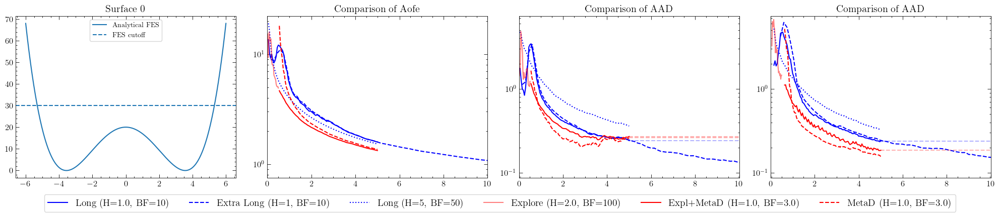

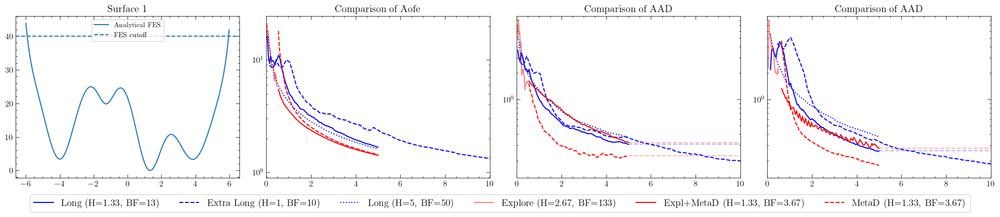

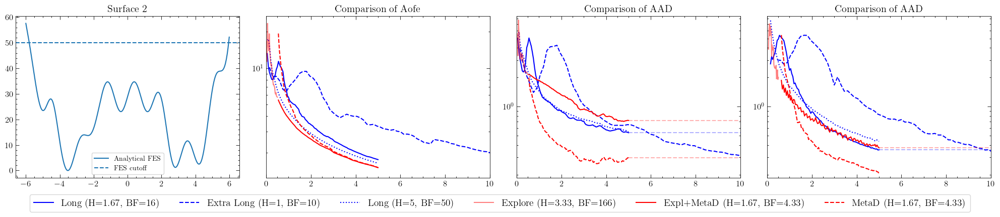

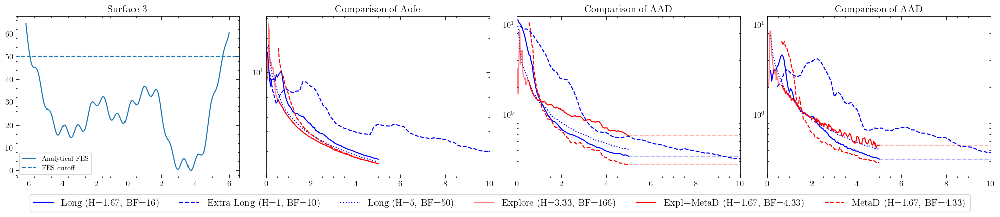

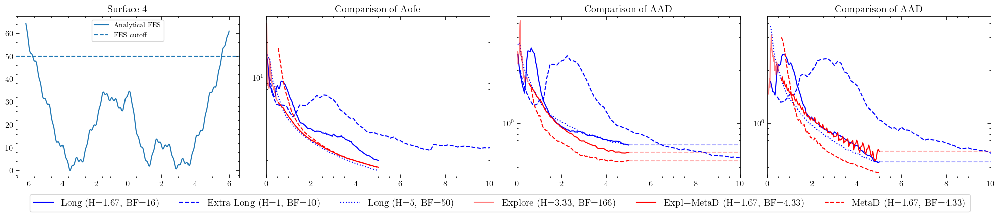

...

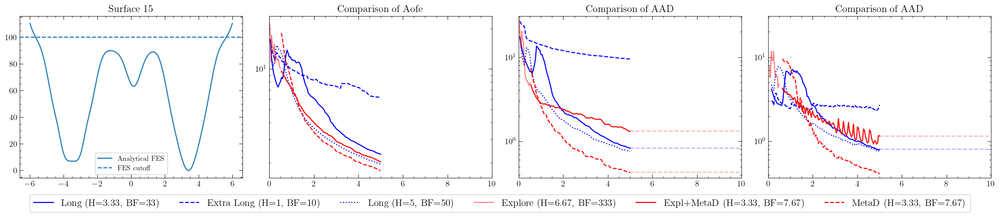

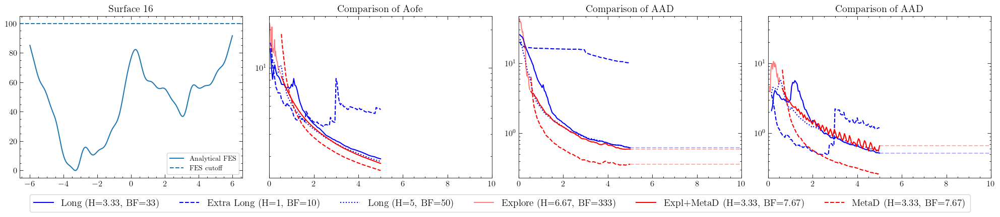

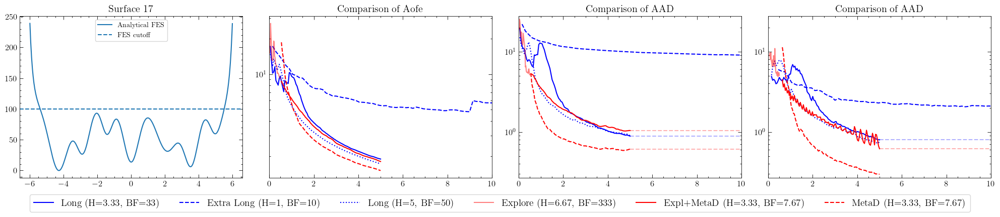

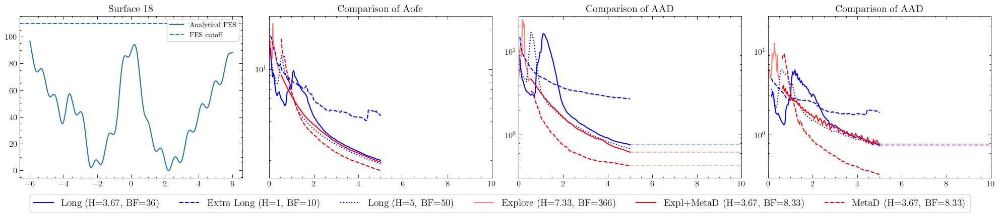

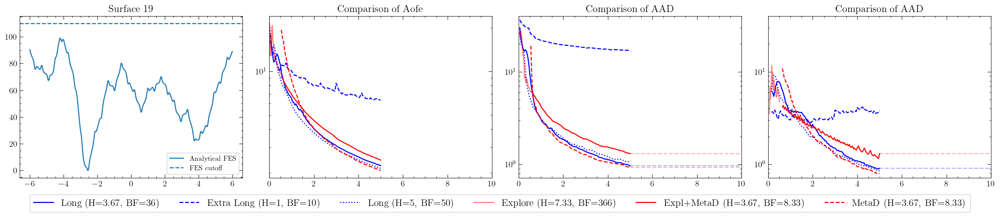

In [13]:
### plot error progression for each surface

# activate this function to smoothen the error progression
def sf(data, window_length=None, polyorder=None):
    # from scipy.signal import savgol_filter
    # if window_length is None: window_length = max(5, int(len(data)/20))    
    # if polyorder is None: polyorder = 2
    # return savgol_filter(data, window_length, polyorder)
    return data

expl_sim_index_list = [13, 91,  7, 53, 97, 68, 69, 92, 48, 37, 5, 13, 76, 38, 85, 81, 89, 58, 66, 24] 

long_final_results, longextra_final_results, longEXPL_final_results, metad_final_results, metadALT_final_results = [[], [], []], [[], [], []], [[], [], []], [[], [], []], [[], [], []]

for n_surf in range(20):
    
    fco = FES_cutoff_list[n_surf]  # FES cutoff

    for _load_and_analyse_x1_data_ in [1]:

        path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
        
        # Long simulation
        t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
        for i_sim in range(1,101):
            sim_ID = f"_long_{i_sim}"
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
            
        t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
        time_long, mean_ofe_long, ste_ofe_long, mean_aad_long, ste_aad_long, mean_abs_long, ste_abs_long = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True) 
        long_final_results[0].append(mean_ofe_long[-1]); long_final_results[1].append(mean_aad_long[-1]); long_final_results[2].append(mean_abs_long[-1])
        plt.close()
        
        # Long ALT extra simulation
        t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
        for i_sim in range(1,101):
            sim_ID = f"_longALTextra_{i_sim}"
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
        time_longALT, mean_ofe_longALT, ste_ofe_longALT, mean_aad_longALT, ste_aad_longALT, mean_abs_longALT, ste_abs_longALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True)
        longextra_final_results[0].append(mean_ofe_longALT[-1]); longextra_final_results[1].append(mean_aad_longALT[-1]); longextra_final_results[2].append(mean_abs_longALT[-1])
        plt.close()
        
        # Long EXPL simulation
        t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
        for i_sim in range(1,81):
            sim_ID = f"_longEXPL_{i_sim}"
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
        time_longEXPL, mean_ofe_longEXPL, ste_ofe_longEXPL, mean_aad_longEXPL, ste_aad_longEXPL, mean_abs_longEXPL, ste_abs_longEXPL = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True)
        longEXPL_final_results[0].append(mean_ofe_longEXPL[-1]); longEXPL_final_results[1].append(mean_aad_longEXPL[-1]); longEXPL_final_results[2].append(mean_abs_longEXPL[-1])
        plt.close()

        # Exploration simulation
        # t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
        # for i_sim in range(1,101):
        #     sim_ID = f"_expl_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_expl, mean_ofe_expl, ste_ofe_expl, mean_aad_expl, ste_aad_expl = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        time_expl, _, ofe_expl, aad_expl, abs_expl = lib1.load_pkl(path_data + f"MFI_results_expl_{expl_sim_index_list[n_surf]}.pkl")[1][1].T


        
        # MetaD simulation
        t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
        for i_sim in range(1,101):
            sim_ID = f"_metad_{i_sim}"
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
            
        t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
        time_metad, mean_ofe_metad, ste_ofe_metad, mean_aad_metad, ste_aad_metad, mean_abs_metad, ste_abs_metad = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=False)
        metad_final_results[0].append(mean_ofe_metad[-1]); metad_final_results[1].append(mean_aad_metad[-1]); metad_final_results[2].append(mean_abs_metad[-1])
        plt.close()
        
        # MetaD ALT simulation
        t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
        for i_sim in range(1,101):
            sim_ID = f"_metadALT_{i_sim}"
            t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
            t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
            
        t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
        time_metadALT, mean_ofe_metadALT, ste_ofe_metadALT, mean_aad_metadALT, ste_aad_metadALT, mean_abs_metadALT, ste_abs_metadALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=False)
        metadALT_final_results[0].append(mean_ofe_metadALT[-1]); metadALT_final_results[1].append(mean_aad_metadALT[-1]); metadALT_final_results[2].append(mean_abs_metadALT[-1])
        plt.close()
        
    for _load_and_analyse_xn_data_ in [1]:

        # # MetaDx2 simulation
        # t_collection, aofe_collection, aad_collection = [], [], []
        # for i_sim in range(1,51):
        #     sim_ID = f"_metadx2_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_metadx2, mean_ofe_metadx2, ste_ofe_metadx2, mean_aad_metadx2, ste_aad_metadx2 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        # # MetaDx2 ALT simulation
        # t_collection, aofe_collection, aad_collection = [], [], []
        # for i_sim in range(1,51):
        #     sim_ID = f"_metadx2ALT_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_metadx2ALT, mean_ofe_metadx2ALT, ste_ofe_metadx2ALT, mean_aad_metadx2ALT, ste_aad_metadx2ALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        
        # # MetaDx4 simulation
        # t_collection, aofe_collection, aad_collection = [], [], []
        # for i_sim in range(1,26):
        #     sim_ID = f"_metadx4_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_metadx4, mean_ofe_metadx4, ste_ofe_metadx4, mean_aad_metadx4, ste_aad_metadx4 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        # # MetaDx4 ALT simulation
        # t_collection, aofe_collection, aad_collection = [], [], []
        # for i_sim in range(1,26):
        #     sim_ID = f"_metadx4ALT_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_metadx4ALT, mean_ofe_metadx4ALT, ste_ofe_metadx4ALT, mean_aad_metadx4ALT, ste_aad_metadx4ALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        # # MetaDx10 simulation
        # t_collection, aofe_collection, aad_collection = [], [], []
        # for i_sim in range(1,10):
        #     sim_ID = f"_metadx10_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_metadx10, mean_ofe_metadx10, ste_ofe_metadx10, mean_aad_metadx10, ste_aad_metadx10 = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        # # MetaDx10 ALT simulation
        # t_collection, aofe_collection, aad_collection = [], [], []
        # for i_sim in range(1,10):
        #     sim_ID = f"_metadx10ALT_{i_sim}"
        #     t, aofe, aad = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        #     t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad)
            
        # t_collection, aofe_collection, aad_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection)
        # time_metadx10ALT, mean_ofe_metadx10ALT, ste_ofe_metadx10ALT, mean_aad_metadx10ALT, ste_aad_metadx10ALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, return_results=True, plot=False, plot_log=False)
        # plt.close()
        
        pass
    
    for _plot_surf_ in [1]:
        fig = plt.figure(figsize=(20, 4))
        plt.subplot(1,4,1)

        y = y_list[n_surf]
        plt.plot(grid, y, label="Analytical FES")
        plt.axhline(y=fco, color="C0", linestyle="--", label="FES cutoff")
        plt.title(f"Surface {n_surf}"); 
        plt.legend(fontsize=10);

    for _plot_ofe_aad_ in [1]:
        ###### PLOT AOFE ###########################################################

        plt.subplot(1,4,2)
        plt.plot(time_long, mean_ofe_long, label=f"Long (H={round(fco/30,2)}, BF={int(fco/3)})", color="blue")
        plt.plot(time_longALT, mean_ofe_longALT, label="Extra Long (H=1, BF=10)", color="blue", linestyle="--")
        plt.plot(time_longEXPL, mean_ofe_longEXPL, label="Long (H=5, BF=50)", color="blue", linestyle=":")
        plt.plot(time_expl, ofe_expl, label="Explore", color="red", alpha=0.5)
        plt.plot(time_metad, mean_ofe_metad, label="Expl+MetaD", color="red")
        plt.plot(time_metadALT, mean_ofe_metadALT, label="MetaD", color="red", linestyle="--")
        # plt.plot(time_metadx2, mean_ofe_metadx2, label="Expl+MetaDx2 (e=0.75)", color="orange")
        # plt.plot(time_metadx2ALT, mean_ofe_metadx2ALT, label="MetaDx2 (e=0.75)", color="orange", linestyle="--")
        # plt.plot(time_metadx3, mean_ofe_metadx3, label="MetaDx3(e=0.67)", color="green")
        # plt.plot(time_metadx4, mean_ofe_metadx4, label="Expl+MetaDx4 (e=0.5)", color="purple")
        # plt.plot(time_metadx4ALT, mean_ofe_metadx4ALT, label="MetaDx4 (e=0.5)", color="purple", linestyle="--")
        # plt.plot(time_metadx6, mean_ofe_metadx6, label="Expl+MetaDx6 (e=0.4)", color="aquamarine")
        # plt.plot(time_metadx6ALT, mean_ofe_metadx6ALT, label="MetaDx6 (e=0.4)", color="aquamarine", linestyle="--")
        # plt.plot(time_metadx10, mean_ofe_metadx10, label="Expl+MetaDx10 (e=0.3)", color="grey")
        # plt.plot(time_metadx10ALT, mean_ofe_metadx10ALT, label="MetaDx10 (e=0.3)", color="grey", linestyle="--")

        plt.xlim(0, 10)
        plt.yscale("log"); plt.title("Comparison of Aofe"); #plt.legend(fontsize=10); 

        ###### Find common min, max of AAD and ABS ###############################

        min_aad = min(np.nanmin(mean_aad_long), np.nanmin(mean_aad_longALT), np.nanmin(aad_expl), np.nanmin(mean_aad_metad), np.nanmin(mean_aad_metadALT), np.nanmin(mean_aad_longEXPL))#, np.nanmin(mean_aad_metadx2), np.nanmin(mean_aad_metadx2ALT), np.nanmin(mean_aad_metadx3), np.nanmin(mean_aad_metadx4), np.nanmin(mean_aad_metadx4ALT), np.nanmin(mean_aad_metadx6), np.nanmin(mean_aad_metadx6ALT), np.nanmin(mean_aad_metadx10), np.nanmin(mean_aad_metadx10ALT)
        min_abs = min(np.nanmin(mean_abs_long), np.nanmin(mean_abs_longALT), np.nanmin(abs_expl), np.nanmin(mean_abs_metad), np.nanmin(mean_abs_metadALT), np.nanmin(mean_abs_longEXPL))#, np.nanmin(mean_abs_expl), np.nanmin(mean_abs_metadx2), np.nanmin(mean_abs_metadx2ALT), np.nanmin(mean_abs_metadx3), np.nanmin(mean_abs_metadx4), np.nanmin(mean_abs_metadx4ALT), np.nanmin(mean_abs_metadx6), np.nanmin(mean_abs_metadx6ALT), np.nanmin(mean_abs_metadx10), np.nanmin(mean_abs_metadx10ALT)
        min_aad = min(min_aad, min_abs) * 0.9
                
        max_aad = max(np.nanmax(mean_aad_long), np.nanmax(mean_aad_longALT), np.nanmax(aad_expl), np.nanmax(mean_aad_metad), np.nanmax(mean_aad_metadALT), np.nanmax(mean_aad_longEXPL))#, np.nanmax(mean_aad_metadx2), np.nanmax(mean_aad_metadx2ALT), np.nanmax(mean_aad_metadx3), np.nanmax(mean_aad_metadx4), np.nanmax(mean_aad_metadx4ALT), np.nanmax(mean_aad_metadx6), np.nanmax(mean_aad_metadx6ALT), np.nanmax(mean_aad_metadx10), np.nanmax(mean_aad_metadx10ALT)
        max_abs = max(np.nanmax(mean_abs_long), np.nanmax(mean_abs_longALT), np.nanmax(abs_expl), np.nanmax(mean_abs_metad), np.nanmax(mean_abs_metadALT), np.nanmax(mean_abs_longEXPL))#, np.nanmax(mean_abs_expl), np.nanmax(mean_abs_metadx2), np.nanmax(mean_abs_metadx2ALT), np.nanmax(mean_abs_metadx3), np.nanmax(mean_abs_metadx4), np.nanmax(mean_abs_metadx4ALT), np.nanmax(mean_abs_metadx6), np.nanmax(mean_abs_metadx6ALT), np.nanmax(mean_abs_metadx10), np.nanmax(mean_abs_metadx10ALT)
        max_aad = max(max_aad, max_abs) * 1.1

        ###### PLOT AAD ###########################################################
        
        plt.subplot(1,4,3)
        plt.plot(time_long, sf(mean_aad_long), label=f"Long (H={round(fco/30,2)}, BF={int(fco/3)})", color="blue"); plt.plot([time_long[-1],10], [mean_aad_long[-1],mean_aad_long[-1]], color="blue", linestyle="--", alpha=0.3)
        plt.plot(time_longALT, sf(mean_aad_longALT), label="Extra Long (H=1, BF=10)", color="blue", linestyle="--")
        plt.plot(time_longEXPL, sf(mean_aad_longEXPL), label="Long (H=5, BF=50)", color="blue", linestyle=":")
        plt.plot(time_expl, aad_expl, label="Explore", color="red", alpha=0.5)
        plt.plot(time_metad, sf(mean_aad_metad), label="Expl+MetaD", color="red"); plt.plot([time_metad[-1],10], [mean_aad_metad[-1],mean_aad_metad[-1]], color="red", linestyle="--", alpha=0.3)
        plt.plot(time_metadALT, sf(mean_aad_metadALT), label="MetaD", color="red", linestyle="--"); plt.plot([time_metad[-1],10], [mean_aad_metadALT[-1],mean_aad_metadALT[-1]], color="red", linestyle="--", alpha=0.3)
        # plt.plot(time_metadx2, sf(mean_aad_metadx2), label="Expl+MetaDx2 (e=0.75)", color="orange")
        # plt.plot(time_metadx2ALT, sf(mean_aad_metadx2ALT), label="MetaDx2 (e=0.75)", color="orange", linestyle="--")
        # plt.plot(time_metadx3, sf(mean_aad_metadx3), label="MetaDx3 (e=0.67)", color="green")
        # plt.plot(time_metadx4, sf(mean_aad_metadx4), label="Expl+MetaDx4 (e=0.5)", color="purple")
        # plt.plot(time_metadx4ALT, sf(mean_aad_metadx4ALT), label="MetaDx4 (e=0.5)", color="purple", linestyle="--")
        # plt.plot(time_metadx6, sf(mean_aad_metadx6), label="Expl+MetaDx6 (e=0.4)", color="aquamarine")
        # plt.plot(time_metadx6ALT, sf(mean_aad_metadx6ALT), label="MetaDx6 (e=0.4)", color="aquamarine", linestyle="--")
        # plt.plot(time_metadx10, mean_aad_metadx10, label="Expl+MetaDx10 (e=0.3)", color="grey")
        # plt.plot(time_metadx10ALT, mean_aad_metadx10ALT, label="MetaDx10 (e=0.3)", color="grey", linestyle="--")

        plt.ylim(min_aad, max_aad)
        plt.xlim(0, 10)
        plt.yscale("log"); plt.title("Comparison of AAD"); #plt.legend(fontsize=10); 

        ###### PLOT ABS ###########################################################

        ax_last = plt.subplot(1,4,4)
        plt.plot(time_long, sf(mean_abs_long), label=f"Long (H={round(fco/30,2)}, BF={int(fco/3)})", color="blue"); plt.plot([time_long[-1],10], [mean_abs_long[-1],mean_abs_long[-1]], color="blue", linestyle="--", alpha=0.3)
        plt.plot(time_longALT, sf(mean_abs_longALT), label="Extra Long (H=1, BF=10)", color="blue", linestyle="--")
        plt.plot(time_longEXPL, sf(mean_abs_longEXPL), label="Long (H=5, BF=50)", color="blue", linestyle=":") 
        plt.plot(time_expl, abs_expl, label=f"Explore (H={round(fco/15,2)}, BF={int(10*fco/3)})", color="red", alpha=0.5)
        plt.plot(time_metad, sf(mean_abs_metad), label=f"Expl+MetaD (H={round(fco/30,2)}, BF={1+round(fco/15, 2)})", color="red"); plt.plot([time_metad[-1],10], [mean_abs_metad[-1],mean_abs_metad[-1]], color="red", linestyle="--", alpha=0.3)
        plt.plot(time_metadALT, sf(mean_abs_metadALT), label=f"MetaD (H={round(fco/30,2)}, BF={1+round(fco/15, 2)})", color="red", linestyle="--"); 
        # plt.plot(time_metadx2, sf(mean_aad_metadx2), label="Expl+MetaDx2 (e=0.75)", color="orange")
        # plt.plot(time_metadx2ALT, sf(mean_aad_metadx2ALT), label="MetaDx2 (e=0.75)", color="orange", linestyle="--")
        # plt.plot(time_metadx3, sf(mean_aad_metadx3), label="MetaDx3 (e=0.67)", color="green")
        # plt.plot(time_metadx4, sf(mean_aad_metadx4), label="Expl+MetaDx4 (e=0.5)", color="purple")
        # plt.plot(time_metadx4ALT, sf(mean_aad_metadx4ALT), label="MetaDx4 (e=0.5)", color="purple", linestyle="--")
        # plt.plot(time_metadx6, sf(mean_aad_metadx6), label="Expl+MetaDx6 (e=0.4)", color="aquamarine")
        # plt.plot(time_metadx6ALT, sf(mean_aad_metadx6ALT), label="MetaDx6 (e=0.4)", color="aquamarine", linestyle="--")
        # plt.plot(time_metadx10, mean_aad_metadx10, label="Expl+MetaDx10 (e=0.3)", color="grey")
        # plt.plot(time_metadx10ALT, mean_aad_metadx10ALT, label="MetaDx10 (e=0.3)", color="grey", linestyle="--")

        plt.ylim(min_aad, max_aad)
        plt.xlim(0, 10)
        plt.yscale("log"); plt.title("Comparison of ABS"); #plt.legend(fontsize=10); 
        
        handles, labels = ax_last.get_legend_handles_labels()
        fig.legend(handles, labels, loc='lower center', ncol=len(labels), bbox_to_anchor=(0.5, -0.1), fontsize=14)
                
        plt.tight_layout(); plt.show()

In [15]:
### Define function to plot results on block-grid

def plot_results_grid(results, results_min=None, results_max=None, n_rows=None, n_cols=None, title=None, row_label=None, col_label=None, row_ticks=None, col_ticks=None, cmap='RdYlGn_r', fig_size_scaling=1, ax=None, plot_show=True):
    """
    Plots a grid where each cell shows one element from results.
    
    Parameters:
      - results: list of numeric values (or "NA") to plot.
      - n_rows, n_cols: grid dimensions (if not provided, and if labels are available,
                        the grid size is taken from the length of the label lists;
                        otherwise, defaults are used).
      - row_ticks: list of strings for y-axis tick labels.
      - col_ticks: list of strings for x-axis tick labels.
      - cmap: colormap name to use for numeric values.
    """
    # import colormap 
    from matplotlib import colors
    
    # Determine n_rows and n_cols
    if n_rows is None or n_cols is None:
        if row_ticks is not None and col_ticks is not None:
            n_rows, n_cols = len(row_ticks), len(col_ticks)
        else:
            n_cols = np.ceil(np.sqrt(len(results)))
            n_rows = np.ceil(len(results) / n_cols)
            
    total_cells = n_rows * n_cols
    # If there are too few results, pad with "NA"
    if len(results) < total_cells: results_extended = results + ["NA"] * (total_cells - len(results))
    else: results_extended = results[:total_cells]
    
    # Reshape the results list into a 2D grid (row-major order).
    grid = np.array(results_extended, dtype=object).reshape((n_rows, n_cols))
    
    # Set up the figure and axis.
    if ax is not None: plot_show = False
    if ax is None: fig, ax = plt.subplots(figsize=(n_cols*fig_size_scaling, n_rows*fig_size_scaling))
            
    # Prepare the colormap normalization using only numeric values.
    numeric_values = [val for val in results if isinstance(val, (int, float))]
    if results_min is not None: vmin = results_min
    elif numeric_values: vmin = min(numeric_values)
    else: vmin = 0
    
    if results_max is not None: vmax = results_max
    elif numeric_values: vmax = np.nanmax(numeric_values)
    else: vmax = 1

    norm = colors.Normalize(vmin=vmin, vmax=vmax)
    cmap_obj = plt.get_cmap(cmap)
    
    # Draw each cell in the grid.
    for i in range(n_rows):
        for j in range(n_cols):
            val = grid[i, j]
            
            # Determine the display text and cell background color.            
            if isinstance(val, (int, float)): display_text, cell_color = f"{val:.3f}", cmap_obj(norm(val))
            elif val == "NA": display_text, cell_color = "NA", (0.9, 0.9, 0.9, 1.0)  # light gray for NA
            else: display_text, cell_color = str(val), (0.9, 0.9, 0.9, 1.0)
            
            # Draw the rectangle for the cell.
            rect = plt.Rectangle((j, i), 1, 1, facecolor=cell_color, edgecolor='black')
            ax.add_patch(rect)
            
            # Place the text in the center of the cell.
            ax.text(j + 0.5, i + 0.5, display_text, ha='center', va='center', color='black', fontweight='bold')
    
    
    # Set limits and ensure cells are square. Set ticks to be at the center of each cell.
    ax.set_xlim(0, n_cols); ax.set_ylim(0, n_rows); ax.set_aspect('equal')
    
    # invert y axis so that first values appear on the top row
    ax.invert_yaxis()
    
    ax.set_xticks(np.arange(n_cols) + 0.5); ax.set_yticks(np.arange(n_rows) + 0.5)
    
    # Apply tick labels if provided; otherwise, use default indices.
    if col_ticks is not None:
        tick_labels = col_ticks[:n_cols] if len(col_ticks) != n_cols else col_ticks
        ax.set_xticklabels(tick_labels, rotation=0, ha='center')
    else: ax.set_xticklabels([str(j) for j in range(n_cols)], rotation=0, ha='center')
    
    if row_ticks is not None:
        tick_labels = row_ticks[:n_rows] if len(row_ticks) != n_rows else row_ticks
        ax.set_yticklabels(tick_labels, rotation=0, va='center')
    else: ax.set_yticklabels([str(i) for i in range(n_rows)], rotation=0, va='center')
    
    # add labels and title
    if col_label is not None: ax.set_xlabel(col_label, labelpad=10)
    if row_label is not None: ax.set_ylabel(row_label, labelpad=10)
    if title is not None: ax.set_title(title)
    
    # Remove the axis spines and ticks for a cleaner look.
    ax.tick_params(top=False, bottom=False, left=False, right=False)
    for spine in ax.spines.values(): spine.set_visible(False)
    
    plt.tight_layout()
    if plot_show: plt.show()

In [16]:
### laod final results

long_final_results, longextra_final_results, longEXPL_final_results, metad_final_results, metadALT_final_results = [[], [], []], [[], [], []], [[], [], []], [[], [], []], [[], [], []]
# longextra_final_results = [[], [], []]

for n_surf in range(20):
    
    path_data = path_notebook + f"/_data_convergence_analysis/surf_{n_surf}/"
    
    # Long simulation
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
    for i_sim in range(1,101):
        sim_ID = f"_long_{i_sim}"
        t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        
    t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
    time_long, mean_ofe_long, ste_ofe_long, mean_aad_long, ste_aad_long, mean_abs_long, ste_abs_long = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True) 
    long_final_results[0].append(mean_ofe_long[-1]); long_final_results[1].append(mean_aad_long[-1]); long_final_results[2].append(mean_abs_long[-1])
    plt.close()
    
    # Long ALT extra simulation
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
    for i_sim in range(1,101):
        sim_ID = f"_longALTextra_{i_sim}"
        t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        
        # shorten the progression to match the long simulation
        t, aofe, aad, aBS = t[:len(t)//3+1], aofe[:len(t)//3+1], aad[:len(t)//3+1], aBS[:len(t)//3+1]
        
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
    t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
    time_longALT, mean_ofe_longALT, ste_ofe_longALT, mean_aad_longALT, ste_aad_longALT, mean_abs_longALT, ste_abs_longALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True)
    longextra_final_results[0].append(mean_ofe_longALT[-1]); longextra_final_results[1].append(mean_aad_longALT[-1]); longextra_final_results[2].append(mean_abs_longALT[-1])
    plt.close()
    
    # Long EXPL simulation
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
    for i_sim in range(1,81):
        sim_ID = f"_longEXPL_{i_sim}"
        t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
    
    t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
    time_longEXPL, mean_ofe_longEXPL, ste_ofe_longEXPL, mean_aad_longEXPL, ste_aad_longEXPL, mean_abs_longEXPL, ste_abs_longEXPL = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=True)
    longEXPL_final_results[0].append(mean_ofe_longEXPL[-1]); longEXPL_final_results[1].append(mean_aad_longEXPL[-1]); longEXPL_final_results[2].append(mean_abs_longEXPL[-1])
    plt.close()
    
    # MetaD simulation
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
    for i_sim in range(1,101):
        sim_ID = f"_metad_{i_sim}"
        t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        
    t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
    time_metad, mean_ofe_metad, ste_ofe_metad, mean_aad_metad, ste_aad_metad, mean_abs_metad, ste_abs_metad = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=False)
    metad_final_results[0].append(mean_ofe_metad[-1]); metad_final_results[1].append(mean_aad_metad[-1]); metad_final_results[2].append(mean_abs_metad[-1])
    plt.close()
    
    # MetaD ALT simulation
    t_collection, aofe_collection, aad_collection, abs_collection = [], [], [], []
    for i_sim in range(1,101):
        sim_ID = f"_metadALT_{i_sim}"
        t, _, aofe, aad, aBS = lib1.load_pkl(path_data + f"error_progression{sim_ID}.pkl")
        t_collection.append(t); aofe_collection.append(aofe); aad_collection.append(aad); abs_collection.append(aBS)
        
    t_collection, aofe_collection, aad_collection, abs_collection = np.array(t_collection), np.array(aofe_collection), np.array(aad_collection), np.array(abs_collection)
    time_metadALT, mean_ofe_metadALT, ste_ofe_metadALT, mean_aad_metadALT, ste_aad_metadALT, mean_abs_metadALT, ste_abs_metadALT = lib1.get_mean_ste_of_n_error_prog(time=t, error_collection=aofe_collection, error_collection_2=aad_collection, error_collection_3=abs_collection, return_results=True, plot=False, plot_log=False)
    metadALT_final_results[0].append(mean_ofe_metadALT[-1]); metadALT_final_results[1].append(mean_aad_metadALT[-1]); metadALT_final_results[2].append(mean_abs_metadALT[-1])
    plt.close()
    

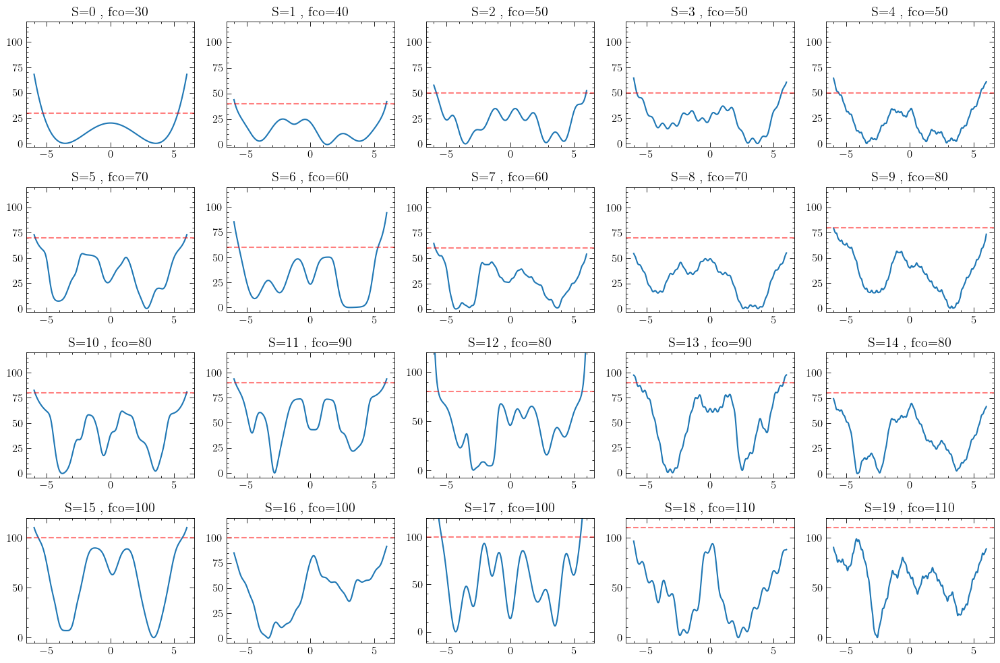

In [23]:
### Plot all surfaces

ylim = [55]*5 + [85]*5 + [95]*5 + [120]*5
ylim = [120]*20

plt.figure(figsize=(15, 10))
for n_surf in range(20):
    plt.subplot(4, 5, n_surf+1)
    plt.plot(grid, y_list[n_surf])
    plt.axhline(FES_cutoff_list[n_surf], color='red', linestyle='--', alpha=0.5)
    plt.title(f"S={n_surf} , fco={FES_cutoff_list[n_surf]}"); plt.ylim(top=ylim[n_surf])
plt.tight_layout(); plt.show()

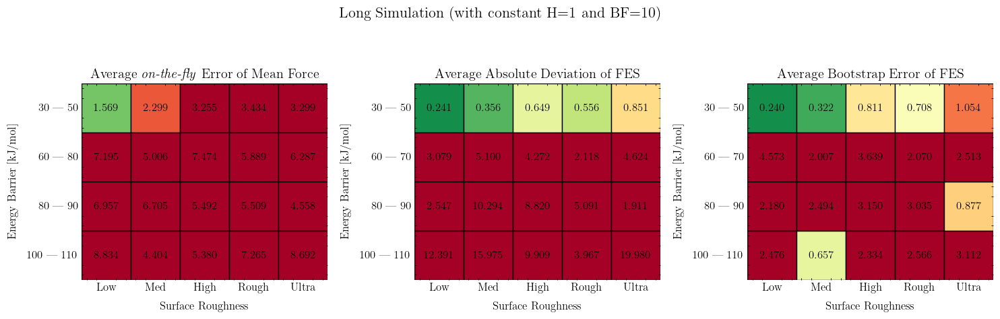

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

plot_results_grid(longextra_final_results[0], fig_size_scaling=1.2, ax=axes[0], title="Average \emph{on-the-fly} Error of Mean Force", results_min=1.3, results_max=2.5,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 80", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(longextra_final_results[1], fig_size_scaling=1.5, ax=axes[1], title="Average Absolute Deviation of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(longextra_final_results[2], fig_size_scaling=1.5, ax=axes[2], title="Average Bootstrap Error of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plt.suptitle("Long Simulation (with constant H=1 and BF=10)", fontsize=16); plt.tight_layout(); plt.show()

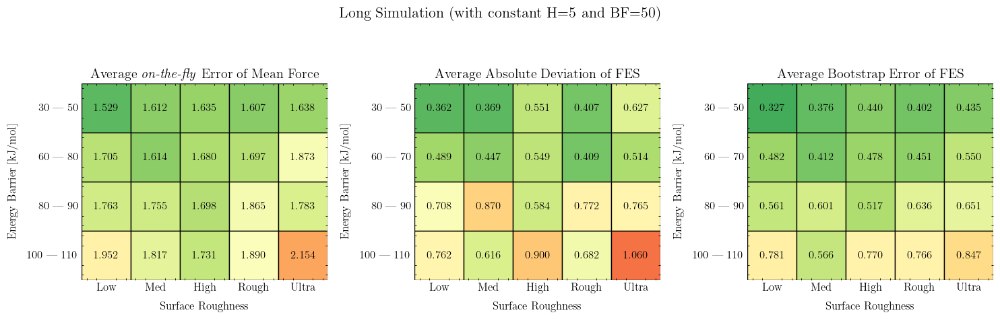

In [17]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

plot_results_grid(longEXPL_final_results[0], fig_size_scaling=1.2, ax=axes[0], title="Average \emph{on-the-fly} Error of Mean Force", results_min=1.3, results_max=2.5,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 80", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(longEXPL_final_results[1], fig_size_scaling=1.5, ax=axes[1], title="Average Absolute Deviation of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(longEXPL_final_results[2], fig_size_scaling=1.5, ax=axes[2], title="Average Bootstrap Error of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plt.suptitle("Long Simulation (with constant H=5 and BF=50)", fontsize=16); plt.tight_layout(); plt.show()

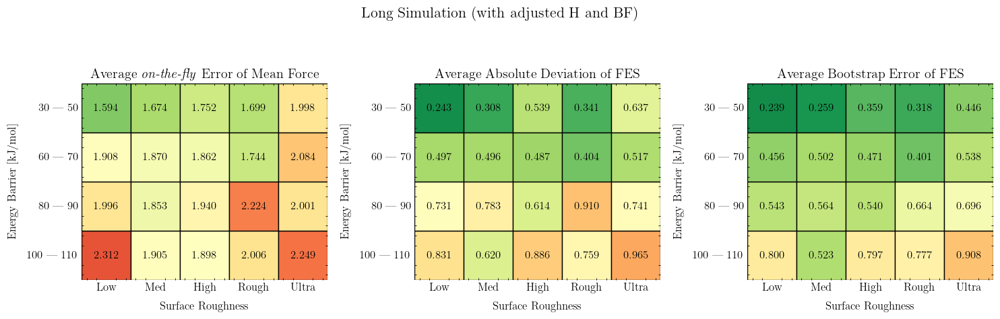

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

plot_results_grid(long_final_results[0], fig_size_scaling=1.2, ax=axes[0], title="Average \emph{on-the-fly} Error of Mean Force", results_min=1.3, results_max=2.5,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(long_final_results[1], fig_size_scaling=1.5, ax=axes[1], title="Average Absolute Deviation of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(long_final_results[2], fig_size_scaling=1.5, ax=axes[2], title="Average Bootstrap Error of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plt.suptitle("Long Simulation (with adjusted H and BF)", fontsize=16); plt.tight_layout(); plt.show() 

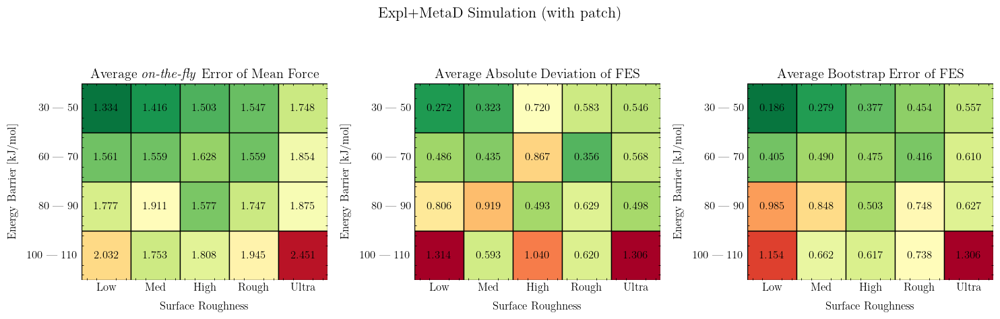

In [26]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

plot_results_grid(metad_final_results[0], fig_size_scaling=1.2, ax=axes[0], title="Average \emph{on-the-fly} Error of Mean Force", results_min=1.3, results_max=2.5,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(metad_final_results[1], fig_size_scaling=1.5, ax=axes[1], title="Average Absolute Deviation of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(metad_final_results[2], fig_size_scaling=1.5, ax=axes[2], title="Average Bootstrap Error of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plt.suptitle("Expl+MetaD Simulation (with patch)", fontsize=16); plt.tight_layout(); plt.show()

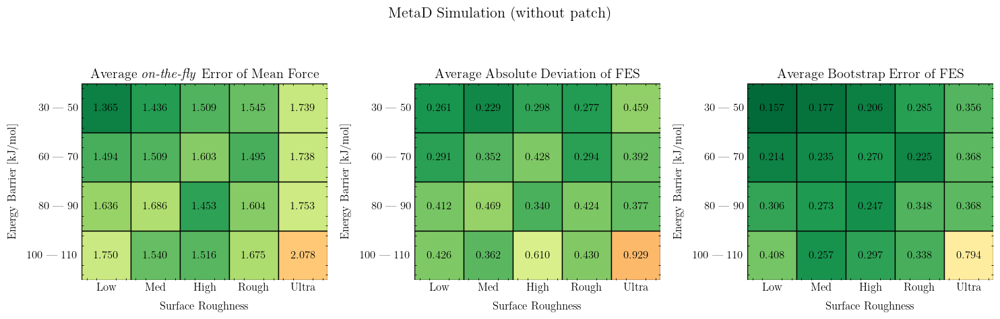

In [27]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

plot_results_grid(metadALT_final_results[0], fig_size_scaling=1.2, ax=axes[0], title="Average \emph{on-the-fly} Error of Mean Force", results_min=1.3, results_max=2.5,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(metadALT_final_results[1], fig_size_scaling=1.5, ax=axes[1], title="Average Absolute Deviation of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plot_results_grid(metadALT_final_results[2], fig_size_scaling=1.5, ax=axes[2], title="Average Bootstrap Error of FES", results_min=0.15, results_max=1.3,
                  row_label="Energy Barrier [kJ/mol]", col_label="Surface Roughness", row_ticks=["30 | 50", "60 | 70", "80 | 90", "100 | 110"], col_ticks=["Low", "Med", "High", "Rough", "Ultra"])

plt.suptitle("MetaD Simulation (without patch)", fontsize=16); plt.tight_layout(); plt.show()

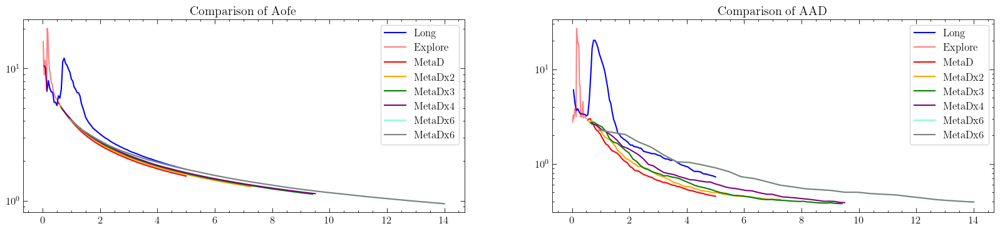

In [31]:
plt.figure(figsize=(20,4))
# time_metad, mean_ofe_metad, ste_ofe_metad, mean_aad_metad, ste_aad_metad

plt.subplot(1,2,1)
plt.plot(time_long, mean_ofe_long, label="Long", color="blue")
# plt.plot(time_expl, mean_ofe_expl, label="Explore", color="red", alpha=0.5)
plt.plot(t_expl, aofe_expl, label="Explore", color="red", alpha=0.5)
plt.plot(time_metad, mean_ofe_metad, label="MetaD", color="red")
plt.plot(time_metadx2, mean_ofe_metadx2, label="MetaDx2", color="orange")
plt.plot(time_metadx3, mean_ofe_metadx3, label="MetaDx3", color="green")
plt.plot(time_metadx4, mean_ofe_metadx4, label="MetaDx4", color="purple")
plt.plot(time_metadx6, mean_ofe_metadx6, label="MetaDx6", color="aquamarine")
plt.plot(time_metadx10, mean_ofe_metadx10, label="MetaDx6", color="grey")
plt.legend(); plt.yscale("log"); plt.title("Comparison of Aofe")

plt.subplot(1,2,2)
plt.plot(time_long, mean_aad_long, label="Long", color="blue"); #plt.plot([t_long[-1],t1x4[-1]], [aad_long[-1],aad_long[-1]], color="blue", linestyle="--", alpha=0.3)
# plt.plot(time_expl, mean_aad_expl, label="Explore", color="red", alpha=0.5)
plt.plot(t_expl, aad_expl, label="Explore", color="red", alpha=0.5)
plt.plot(time_metad, mean_aad_metad, label="MetaD", color="red");#plt.plot([t1x1[-1],t1x4[-1]], [aad1x1[-1],aad1x1[-1]], color="red", linestyle="--", alpha=0.3)
plt.plot(time_metadx2, mean_aad_metadx2, label="MetaDx2", color="orange")
plt.plot(time_metadx3, mean_aad_metadx3, label="MetaDx3", color="green")
plt.plot(time_metadx4, mean_aad_metadx4, label="MetaDx4", color="purple")
plt.plot(time_metadx6, mean_aad_metadx6, label="MetaDx6", color="aquamarine")
plt.plot(time_metadx10, mean_aad_metadx10, label="MetaDx6", color="grey")

# plt.ylim(0.38, 0.6)
plt.legend(); plt.yscale("log"); plt.title("Comparison of AAD"); plt.show()
